In [1]:
import numpy as np
import cupy as cp

import poppy
from poppy.poppy_core import PlaneType

import matplotlib.pyplot as plt
from matplotlib.patches import Circle
import astropy.units as u
from astropy.io import fits
from pathlib import Path
from IPython.display import clear_output, display

from importlib import reload

import logging, sys
poppy_log = logging.getLogger('poppy')
poppy_log.setLevel('DEBUG')
logging.basicConfig(stream=sys.stdout, level=logging.INFO)

from scoobpsf import scoobm, agpm
reload(scoobm)

import lina
from lina.imshows import imshow1, imshow2, imshow3
xp = lina.math_module.xp

# import misc_funs as misc

poppy_log.disabled = True

pupil_diam = 6.75*u.mm
wavelength_c = 632.8e-9*u.m

dm_flat = fits.getdata(scoobm.module_path/'scoob_dm_flat.fits')

vortex = agpm.IdealAGPM(name='VVC', wavelength=wavelength_c, charge=6, rotation=20)
lyot_stop = poppy.CircularAperture(name='Lyot Stop', radius=3.6*u.mm/2, gray_pixel=False)

Could not import scoobpy. Testbed interface unavailable.


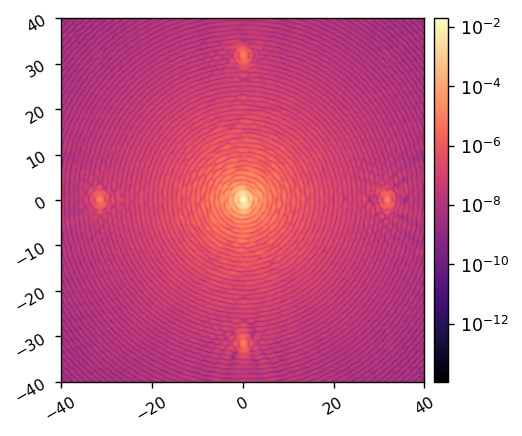

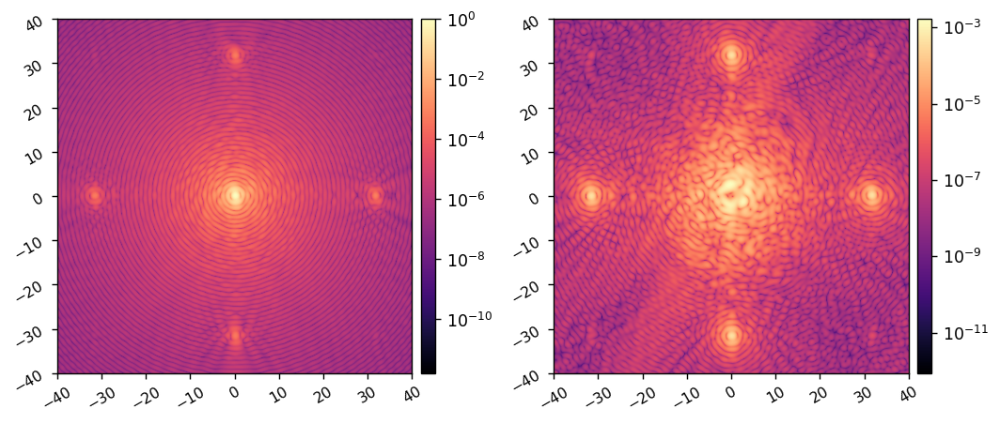

In [2]:
reload(scoobm)
model = scoobm.SCOOBM()
model.det_rotation = 0
model.set_dm(dm_flat)

ref_im = model.snap()
imshow1(ref_im, lognorm=True, pxscl=model.psf_pixelscale_lamD)

model.imnorm = ref_im.max()
normalized_im = model.snap()

model.FPM = vortex
model.LYOT = lyot_stop

occ_im = model.snap()
imshow2(normalized_im, occ_im, lognorm1=True, lognorm2=True, pxscl=model.psf_pixelscale_lamD)

Nact = model.Nact
npsf = model.npsf
psf_pixelscale_lamD = model.psf_pixelscale_lamD

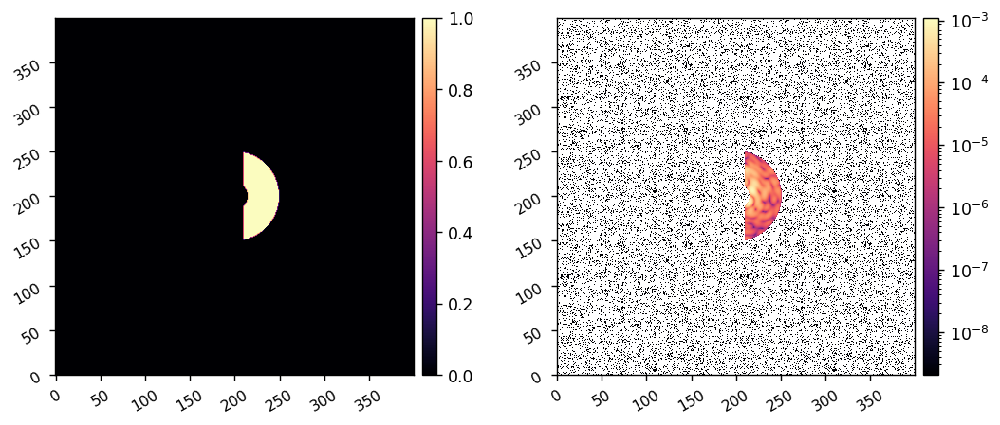

In [3]:
reload(utils)
npsf = model.npsf
nact = model.Nact

xfp = (xp.linspace(-npsf/2, npsf/2-1, npsf) + 1/2)*model.psf_pixelscale_lamD
fpx,fpy = xp.meshgrid(xfp,xfp)

edge = 2
iwa = 3
owa = 10
rot = 0

# Create the mask that is used to select which region to make dark.
dark_params = {
    'inner_radius' : iwa,
    'outer_radius' : owa,
    'edge' : edge,
    'rotation':rot,
}
dark_mask = utils.create_annular_focal_plane_mask(fpx, fpy, dark_params)
imshow2(dark_mask, dark_mask*occ_im, lognorm2=True)

In [4]:
# reload(efc)

# model.set_dm(dm_flat)
# epsilon = 1e-9 # poke amplitudes (DM surface)
# jac = efc.build_jacobian(model, epsilon, dark_mask.flatten(), display=False)

In [5]:
# import misc_funs as misc
# misc.save_fits('jac.fits', utils.ensure_np_array(jac))

In [6]:
jac = xp.array(fits.getdata('jac.fits'))

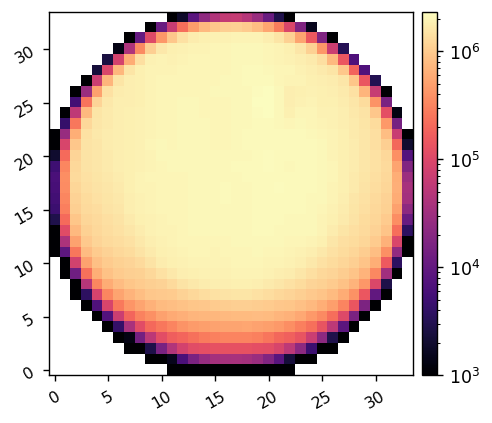

In [7]:
reload(utils)
response = utils.map_acts_to_dm(xp.sqrt(((jac)**2).sum(axis=0)).get(), model.dm_mask)
imshow1(response, lognorm=True, vmin=1e3)

In [8]:
reload(utils)


Beginning closed-loop EFC simulation.
Max singular value squared:	 30645517736623.81
alpha^2:			 5377789847567.994

	Running iteration 1/10.


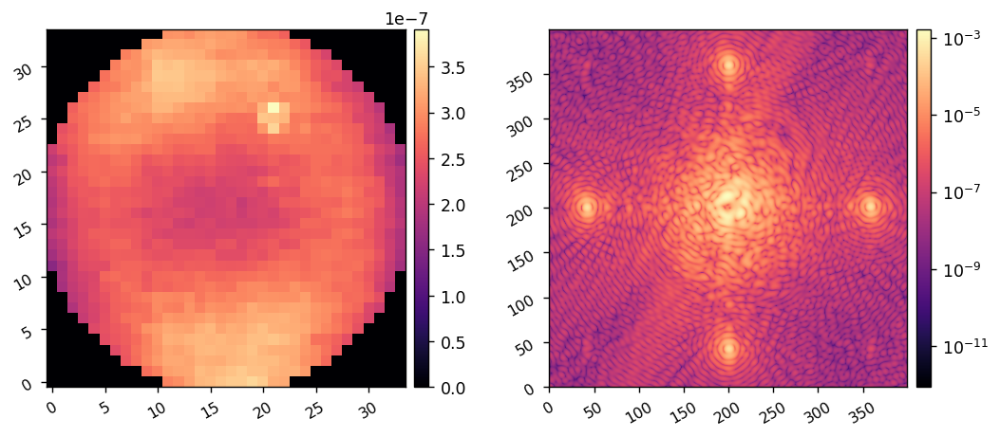

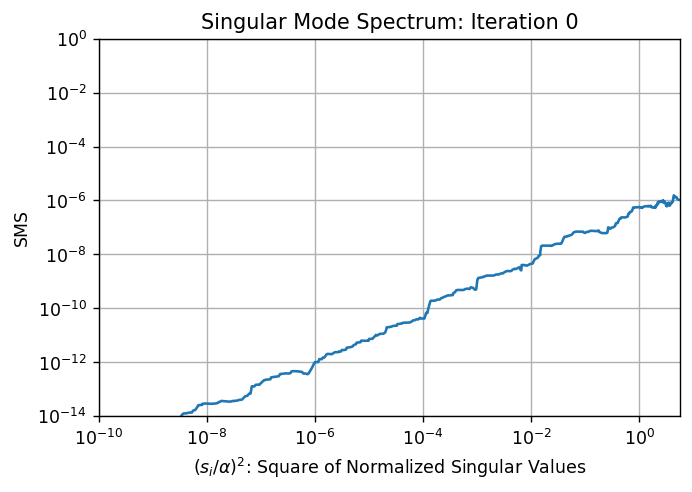

C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


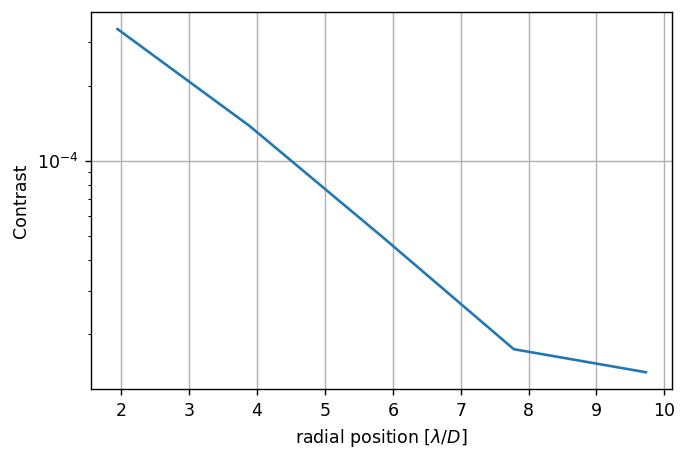

	Running iteration 2/10.


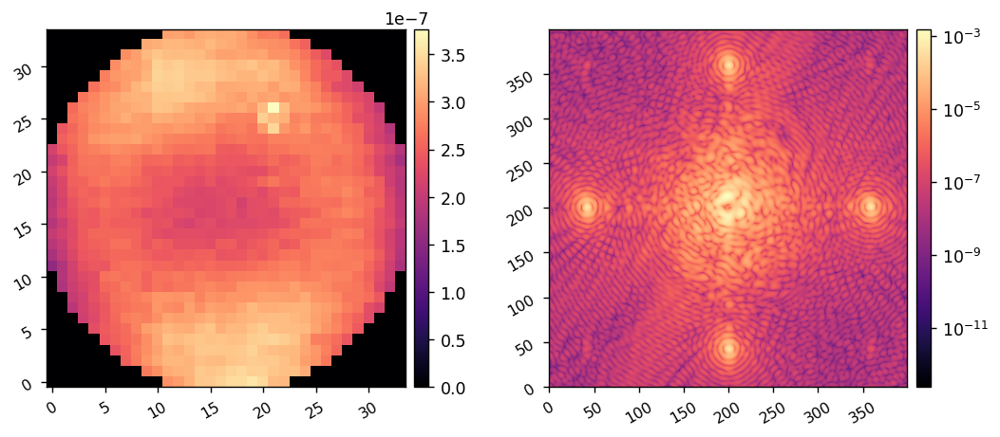

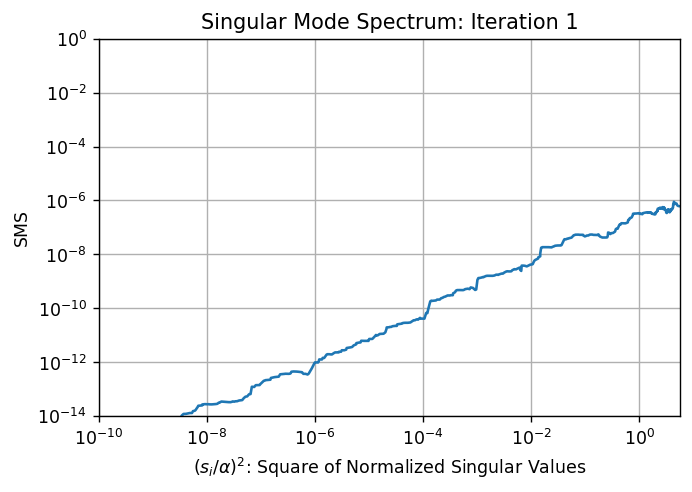

C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


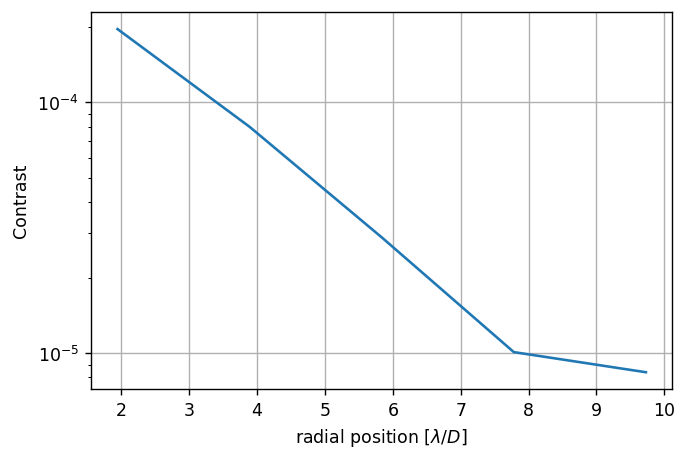

	Running iteration 3/10.


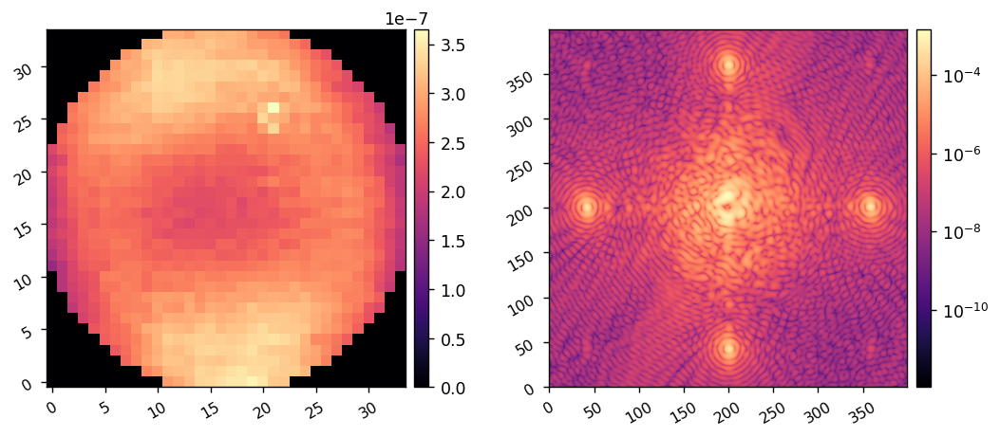

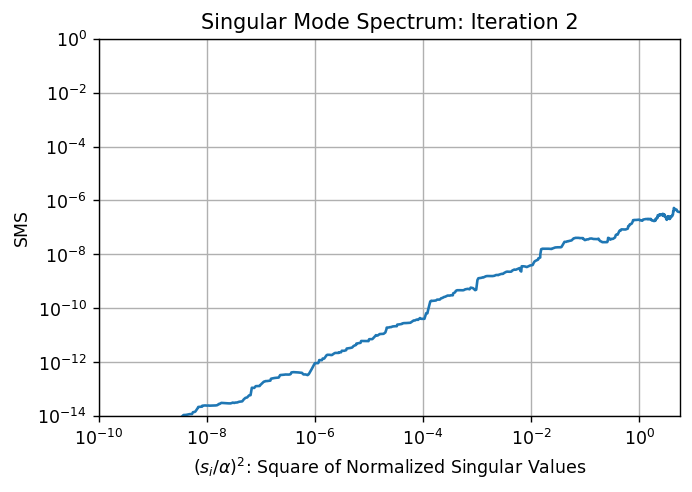

C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


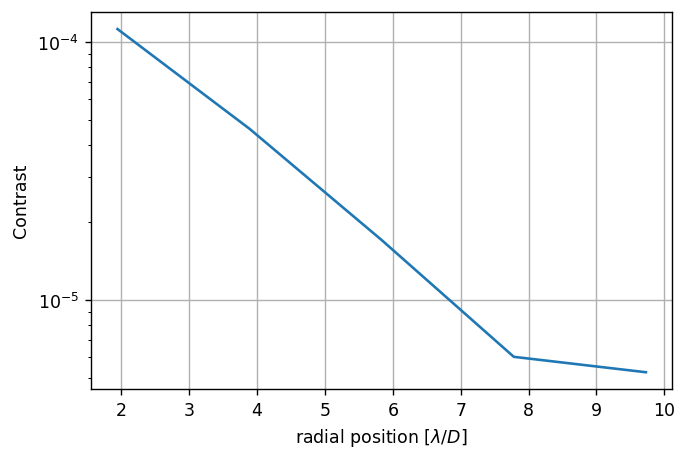

	Running iteration 4/10.


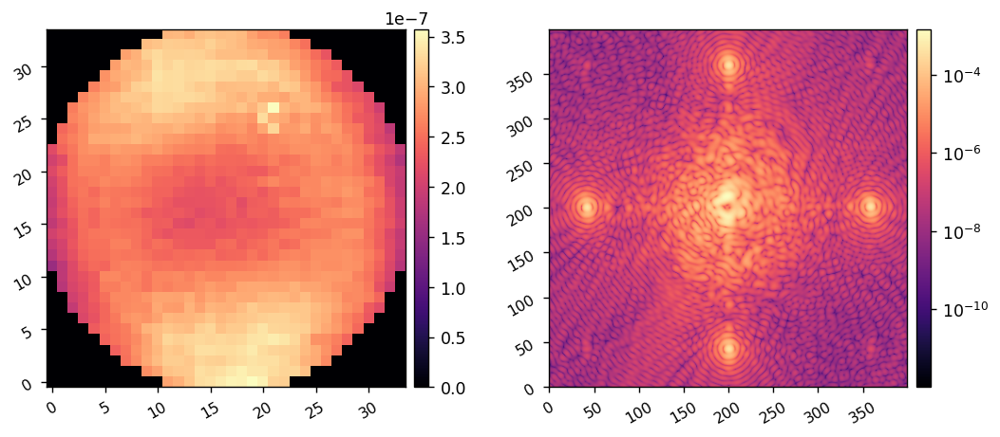

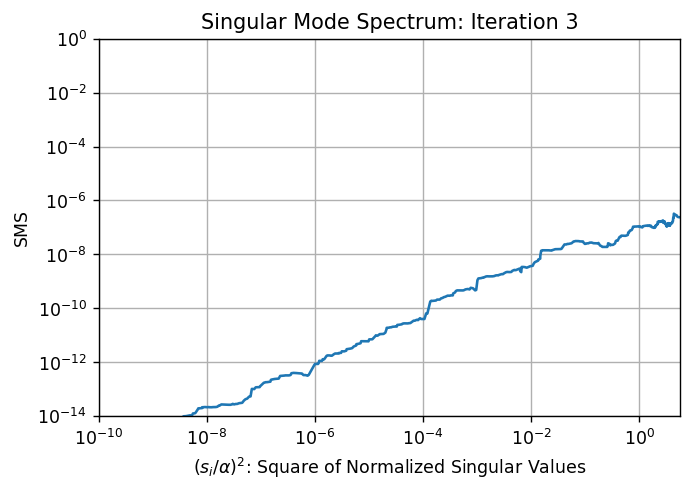

C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


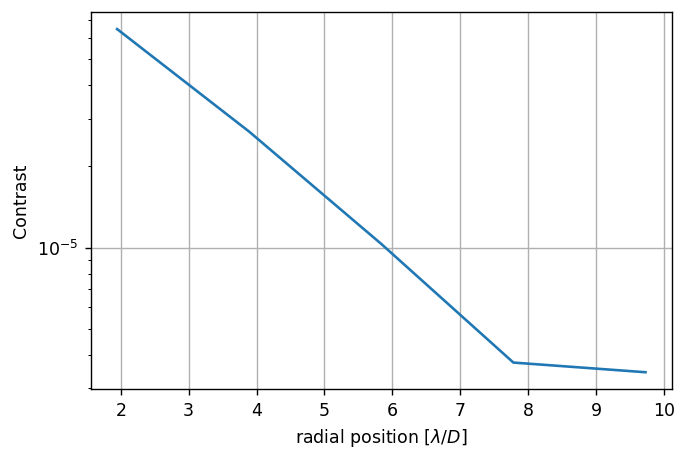

	Running iteration 5/10.


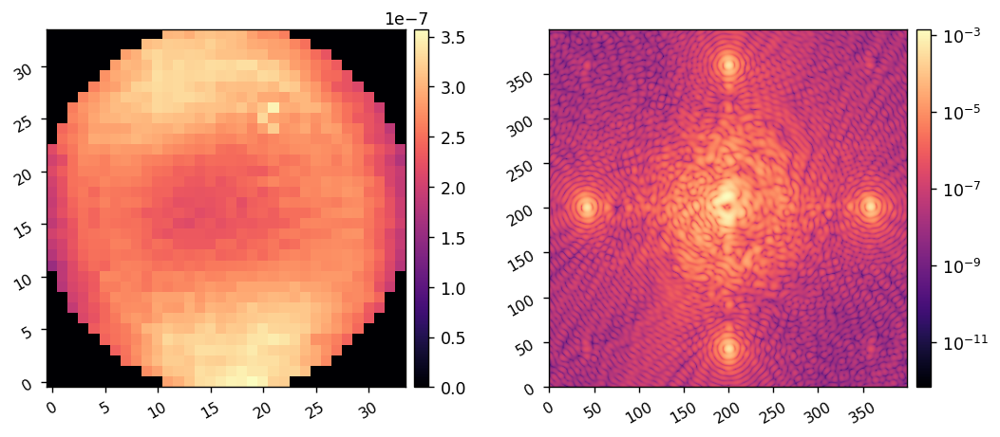

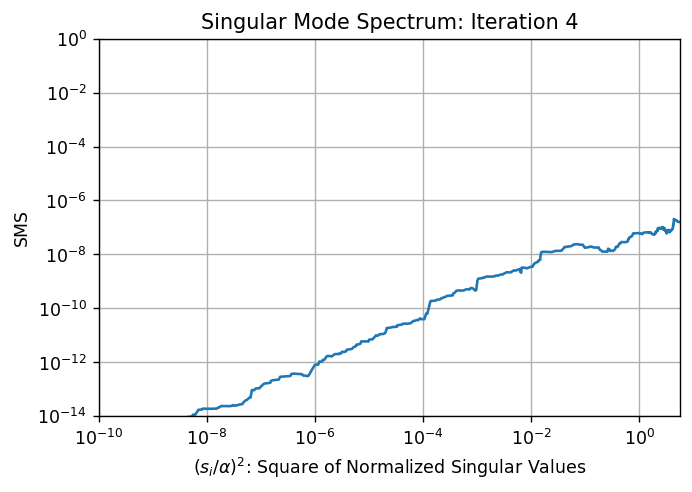

C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


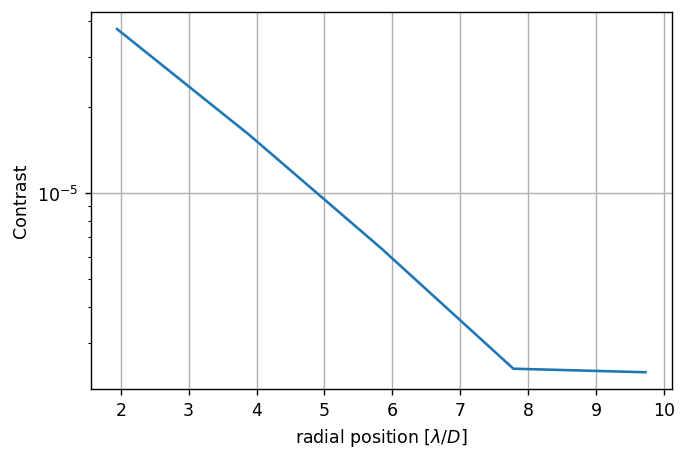

	Running iteration 6/10.


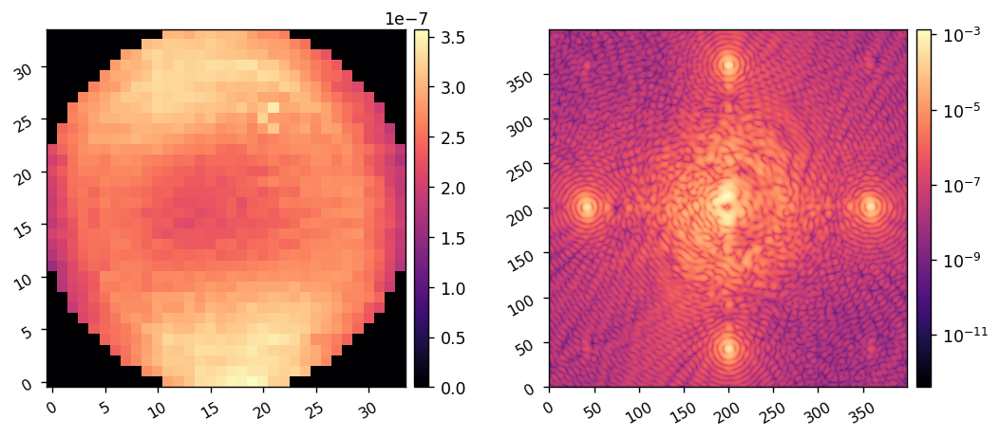

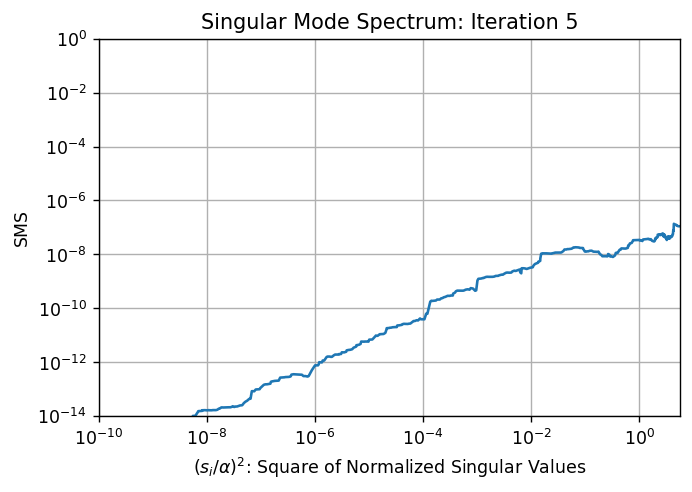

C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


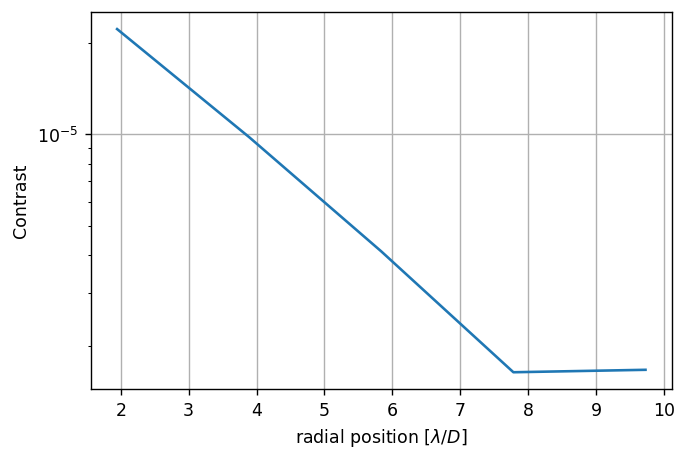

	Running iteration 7/10.


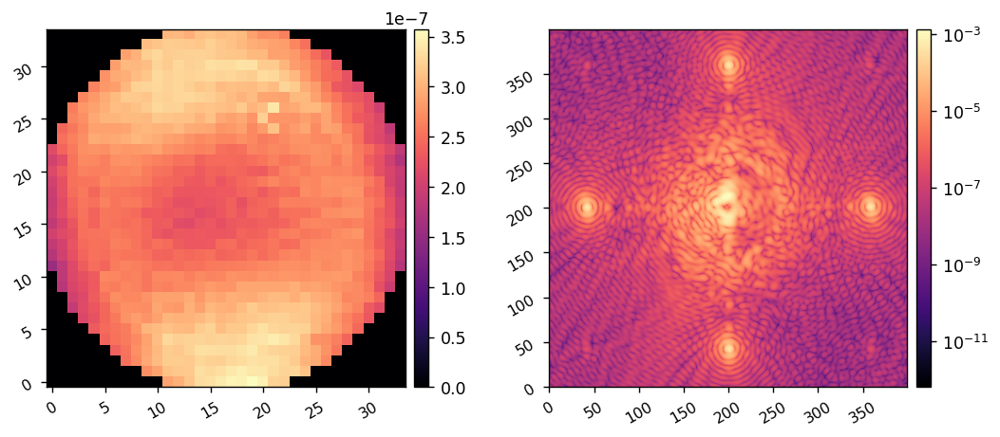

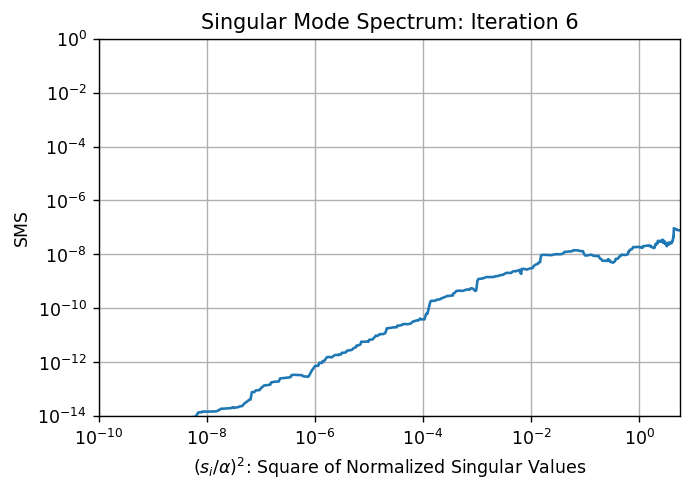

C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


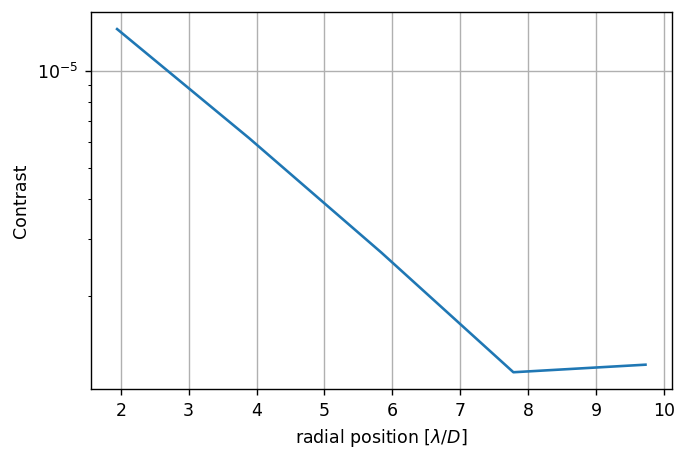

	Running iteration 8/10.


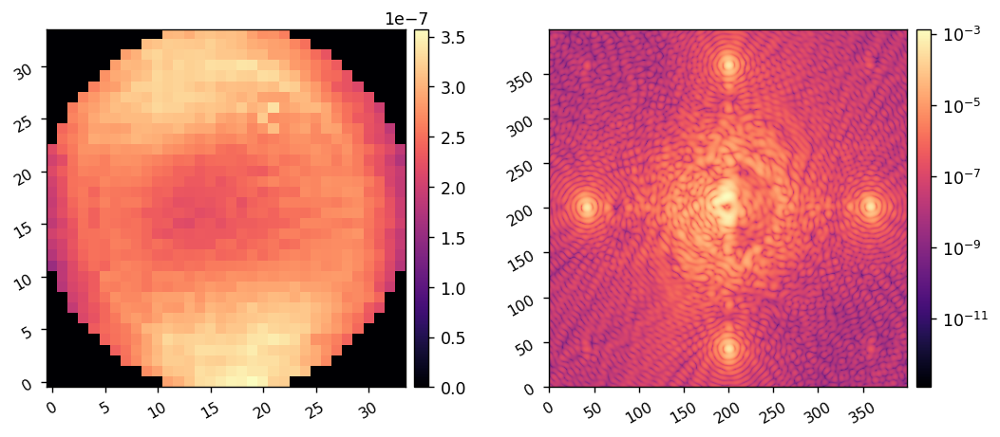

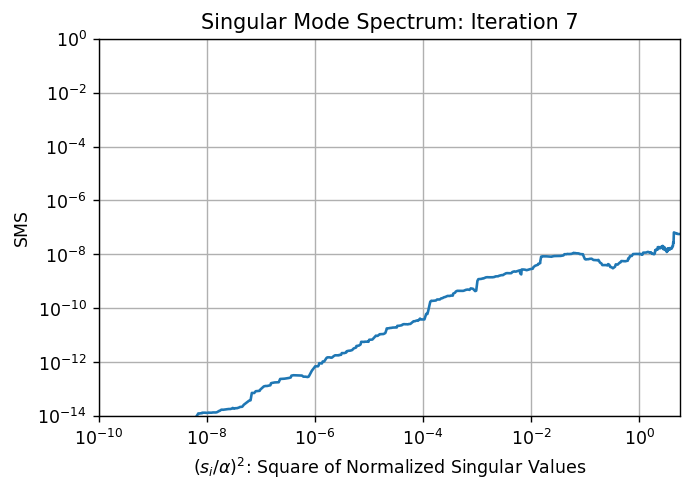

C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


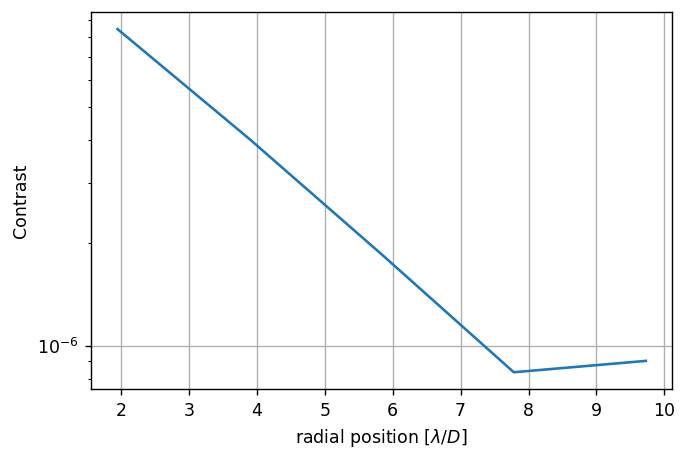

	Running iteration 9/10.


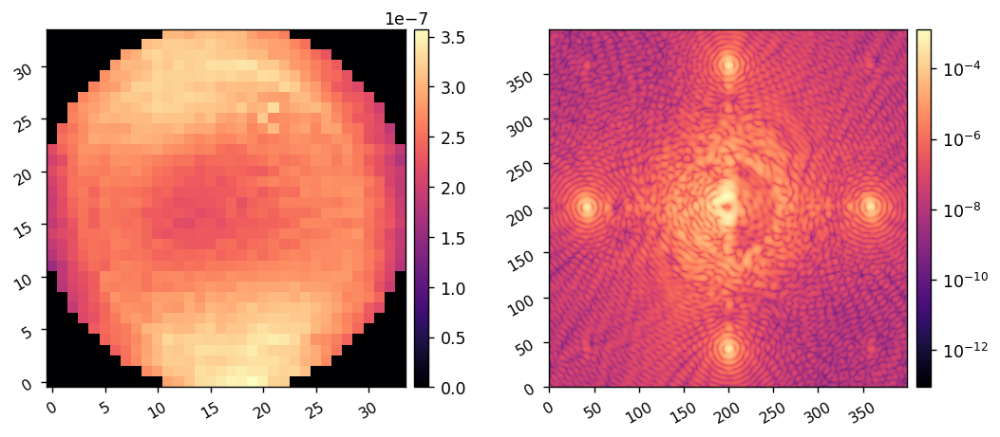

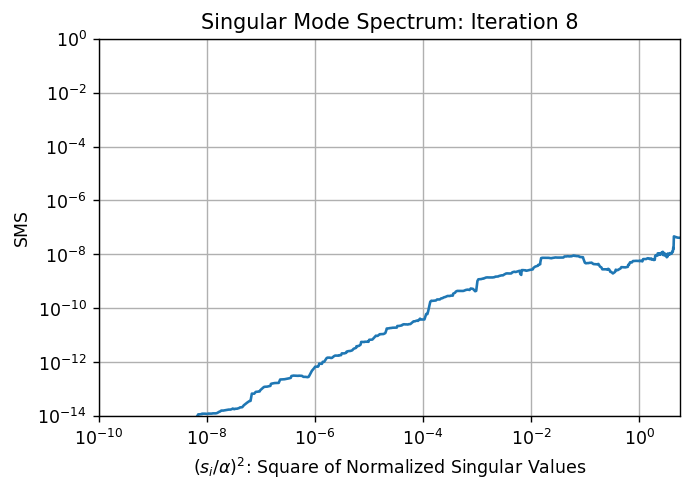

C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


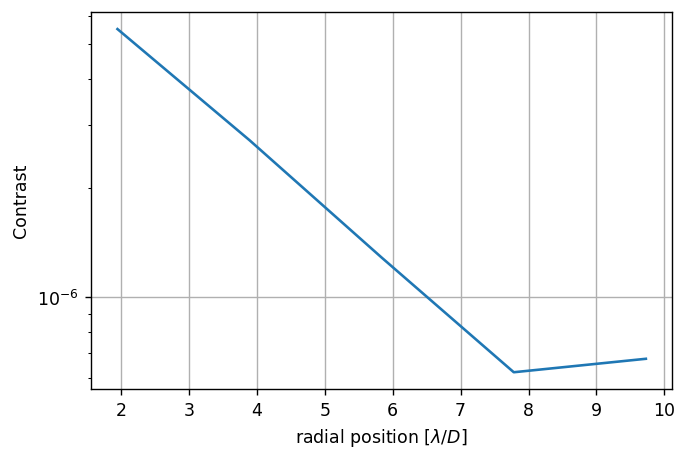

	Running iteration 10/10.


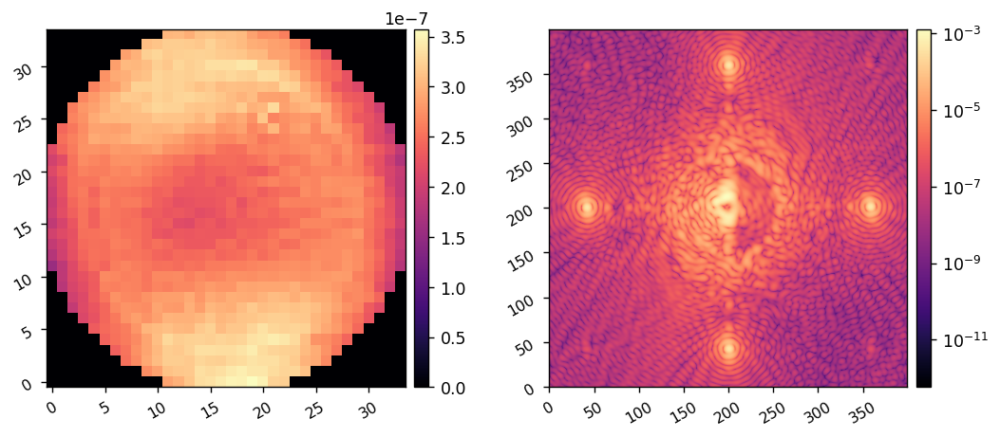

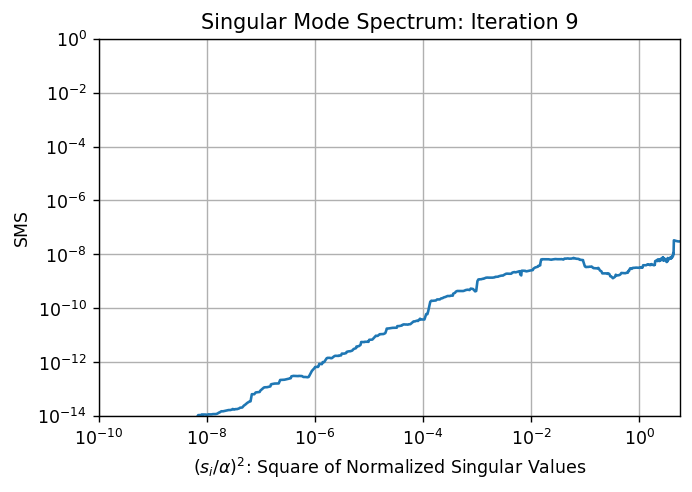

C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


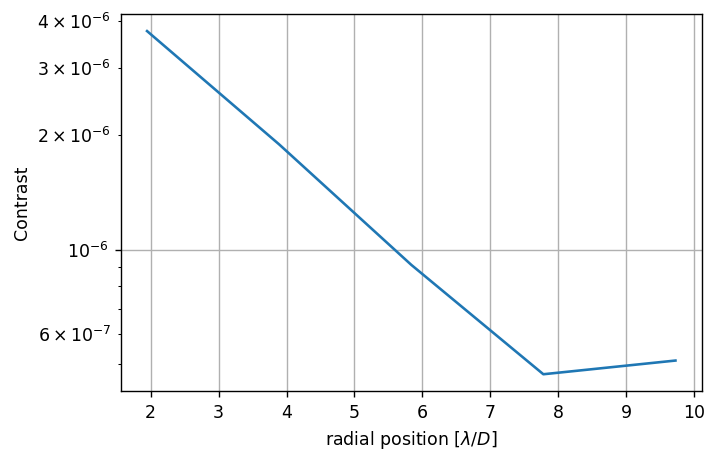

	Running iteration 11/10.


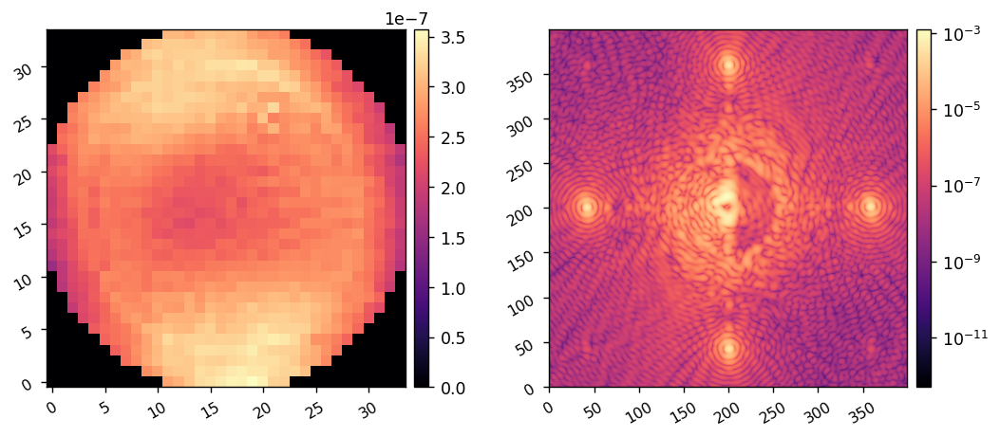

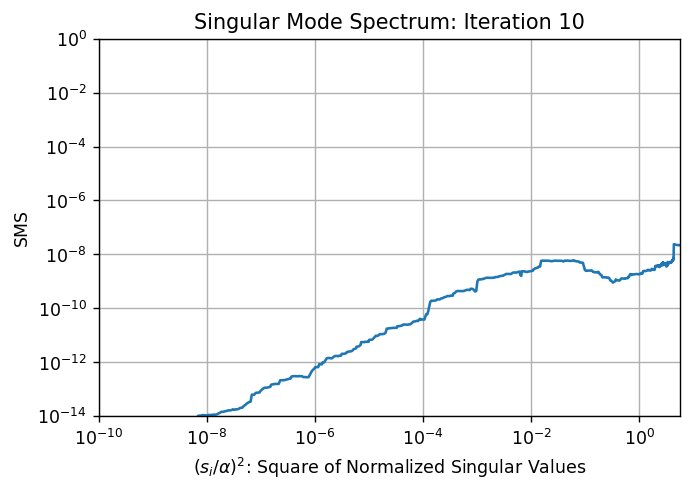

C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


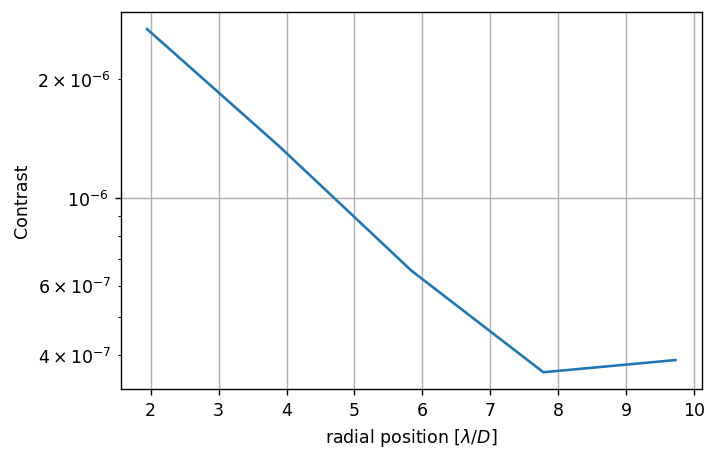

EFC completed in 10.797 sec.
Beginning closed-loop EFC simulation.
Max singular value squared:	 30645517736623.81
alpha^2:			 5377789847567.994

	Running iteration 1/10.


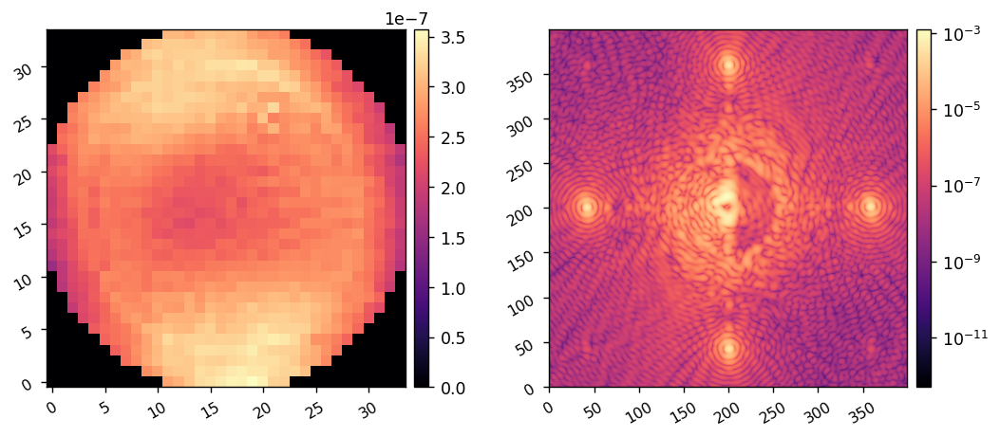

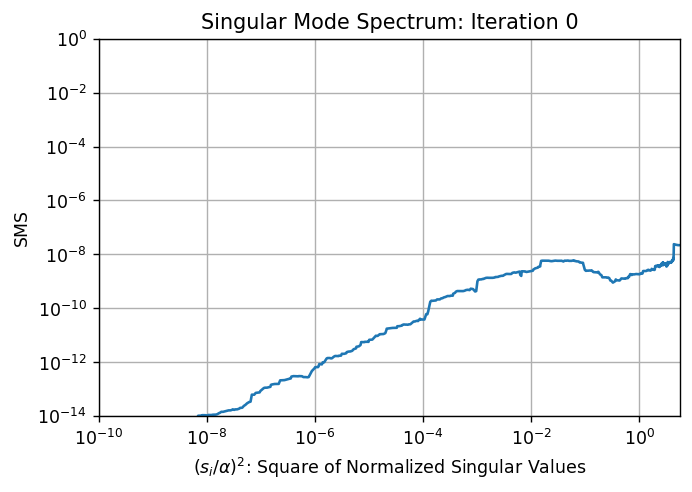

C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


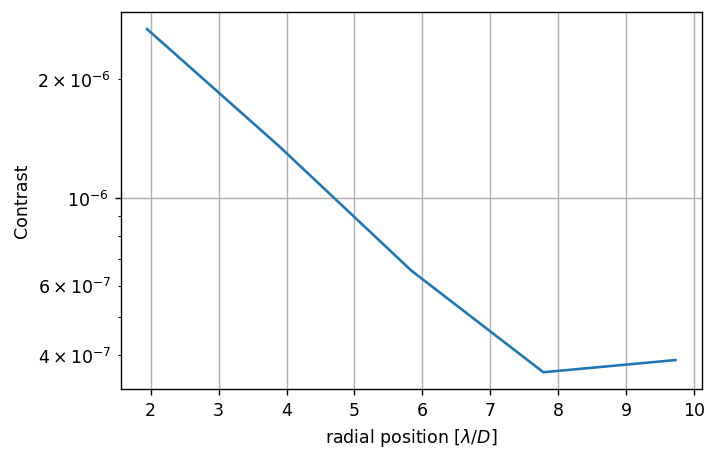

	Running iteration 2/10.


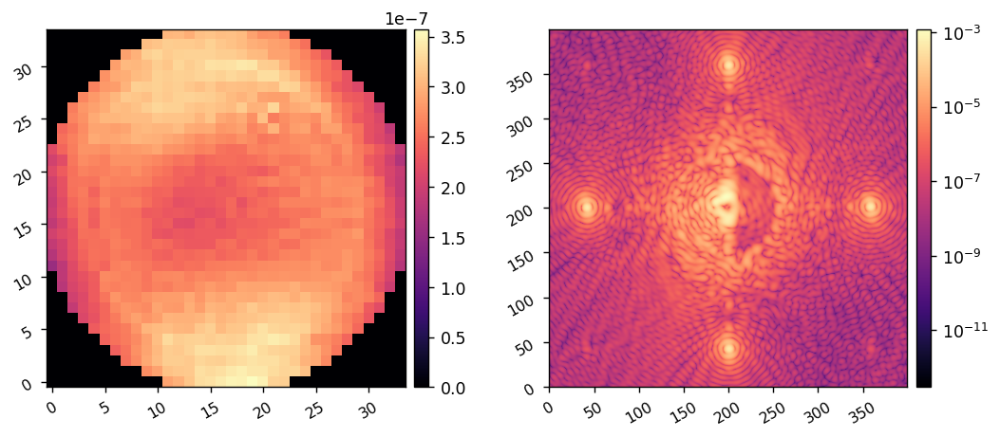

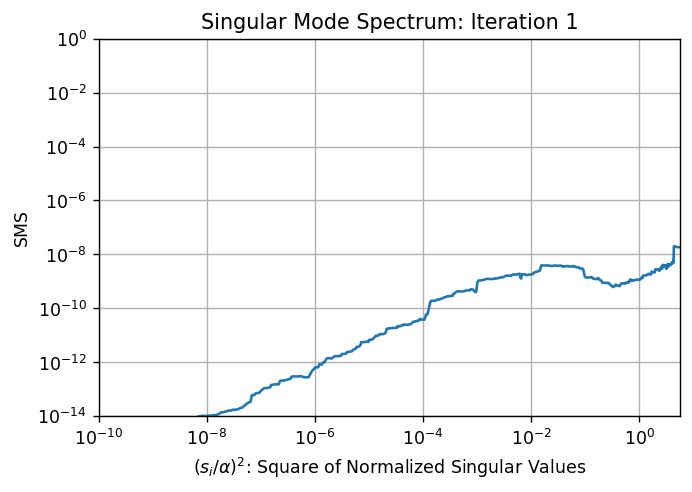

C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


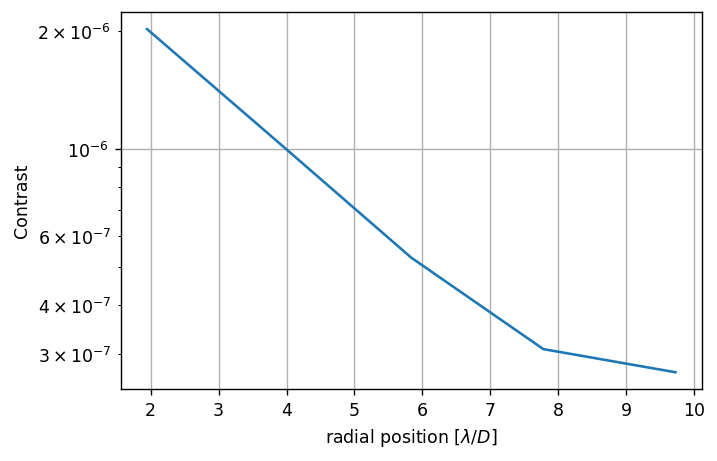

	Running iteration 3/10.


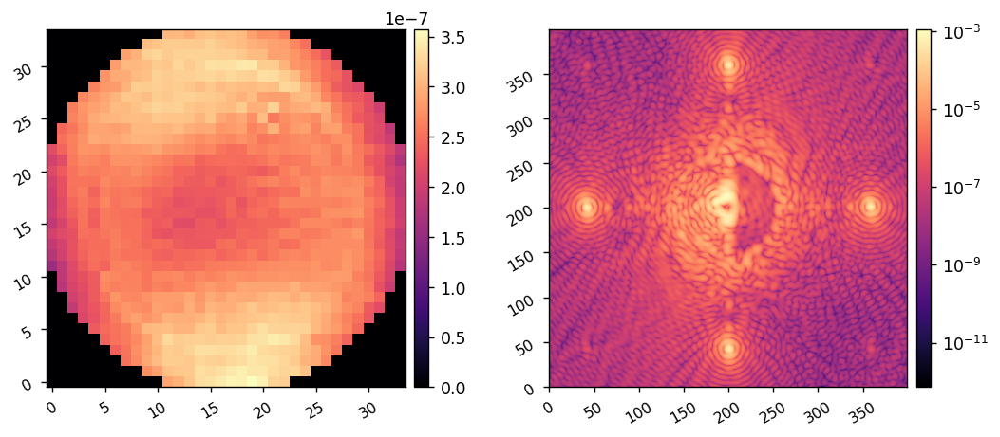

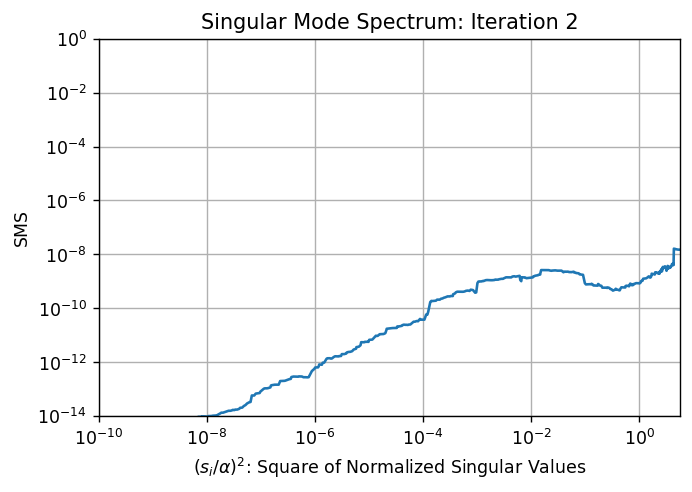

C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


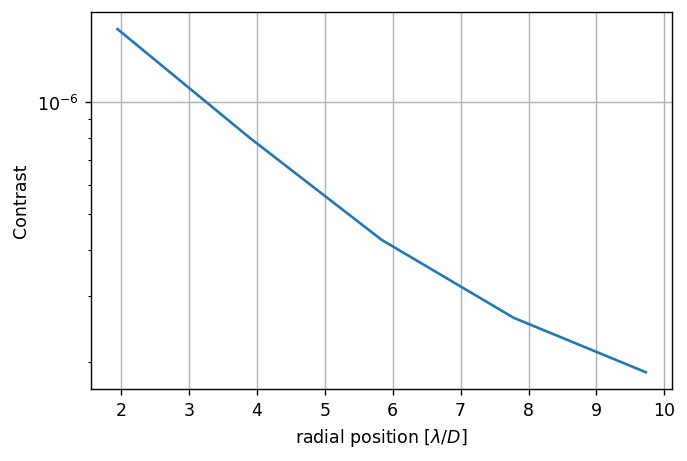

	Running iteration 4/10.


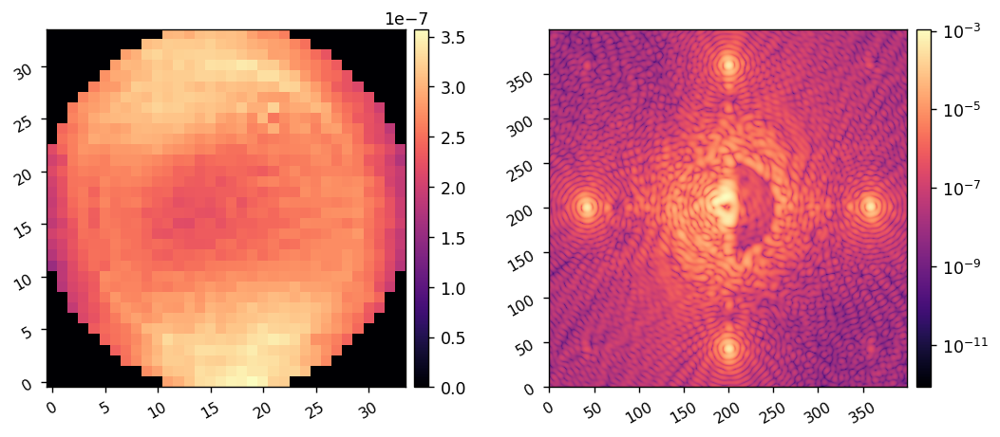

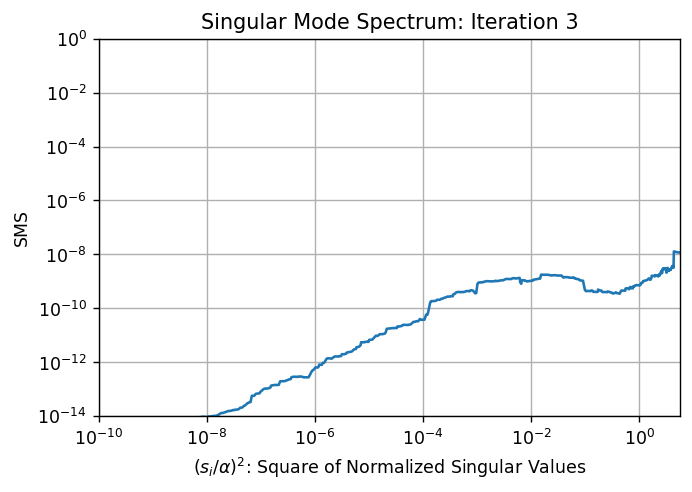

C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


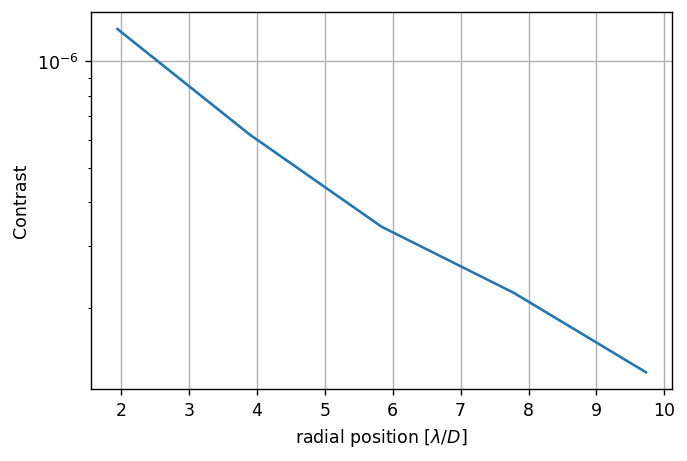

	Running iteration 5/10.


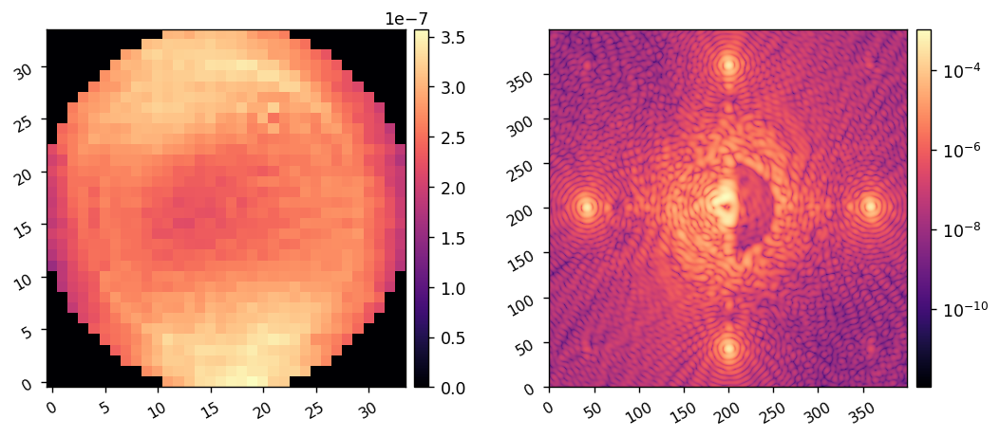

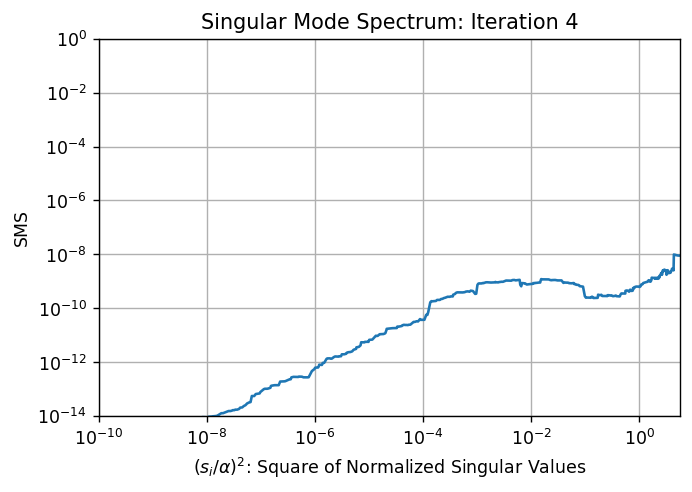

C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


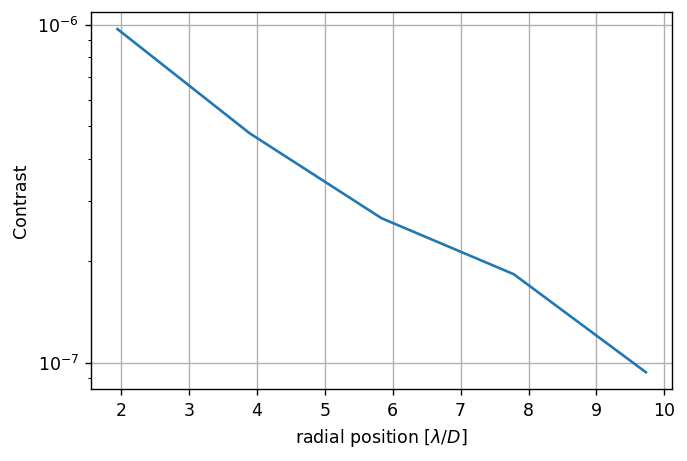

	Running iteration 6/10.


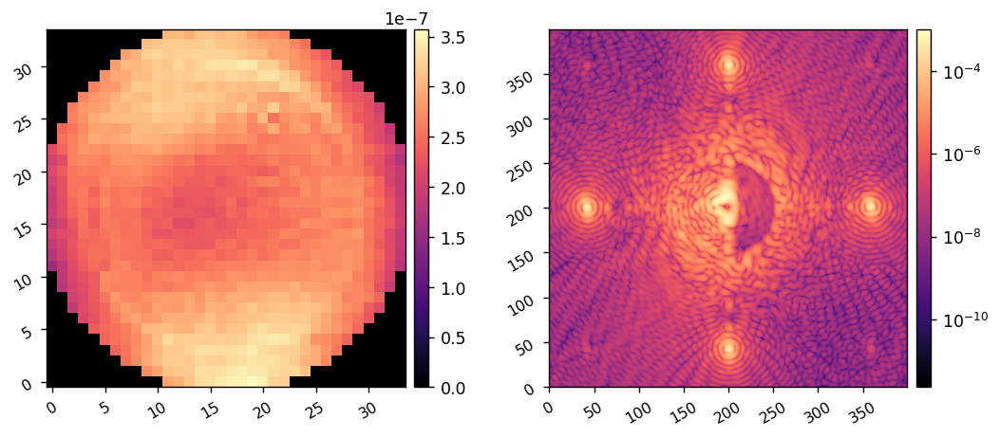

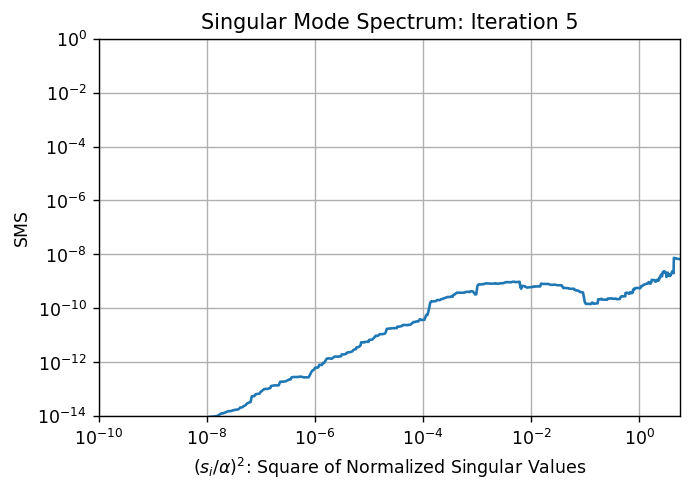

C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


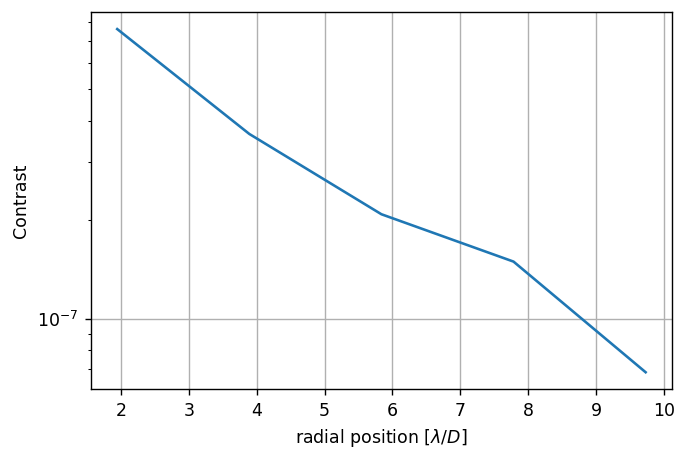

	Running iteration 7/10.


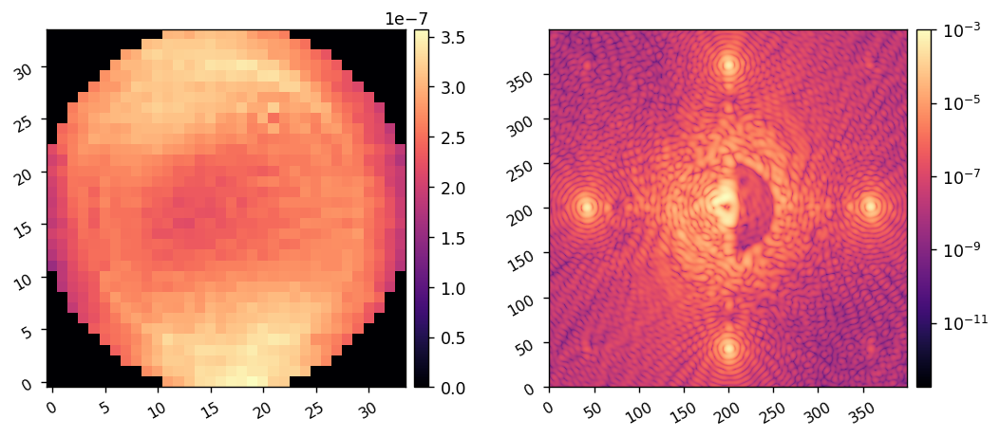

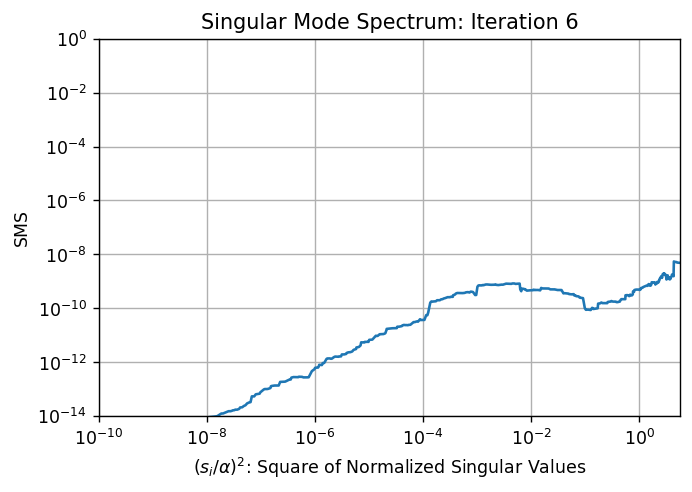

C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


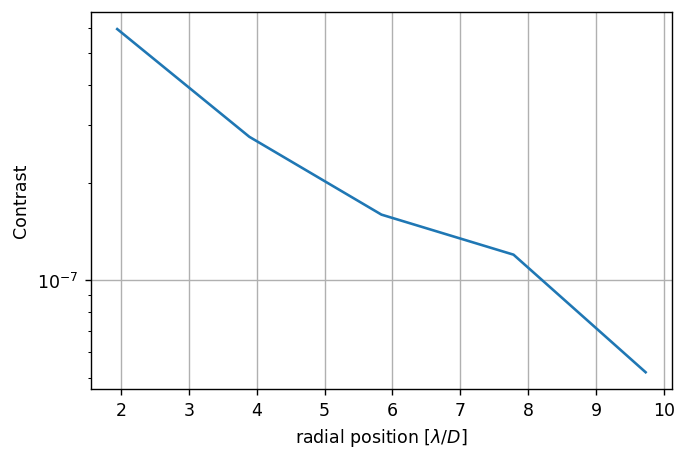

	Running iteration 8/10.


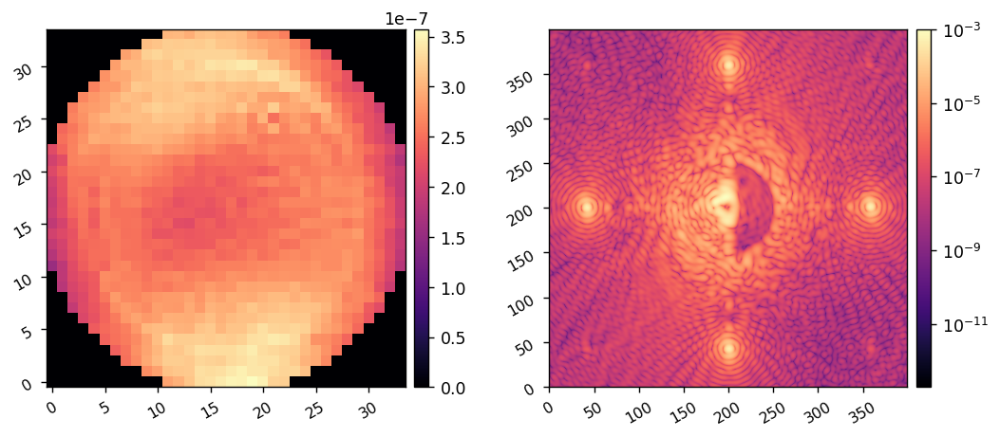

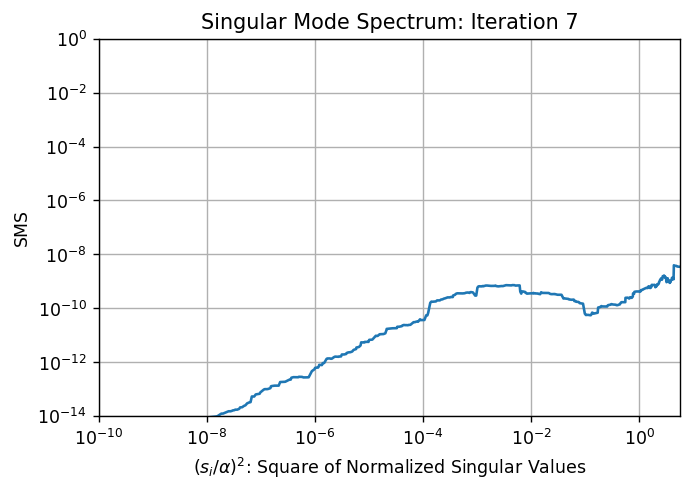

C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


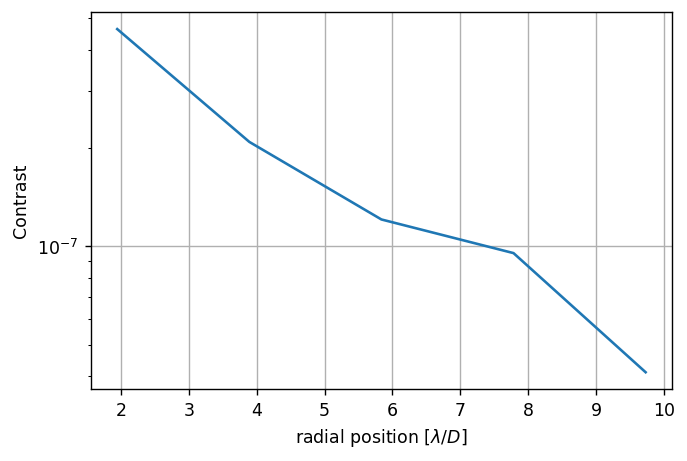

	Running iteration 9/10.


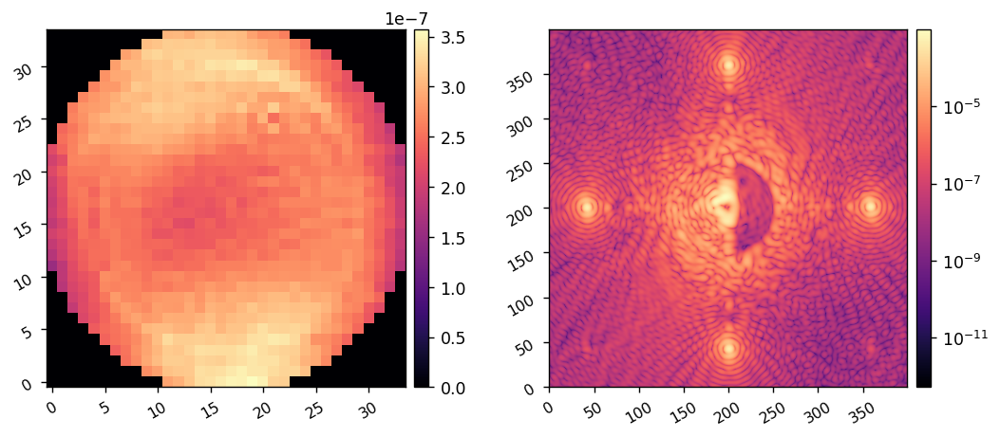

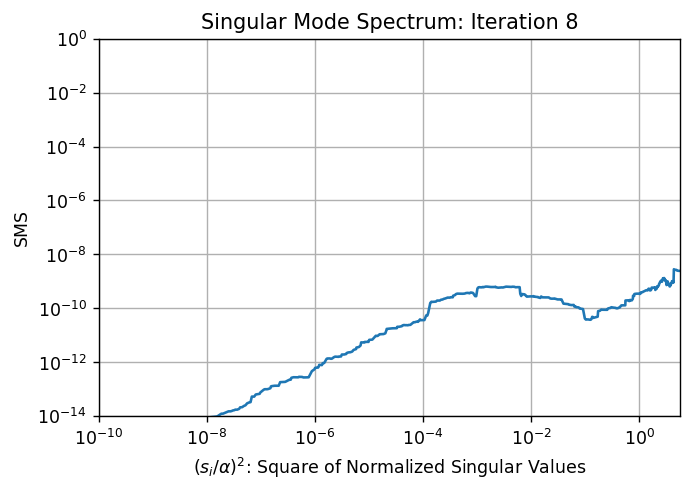

C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


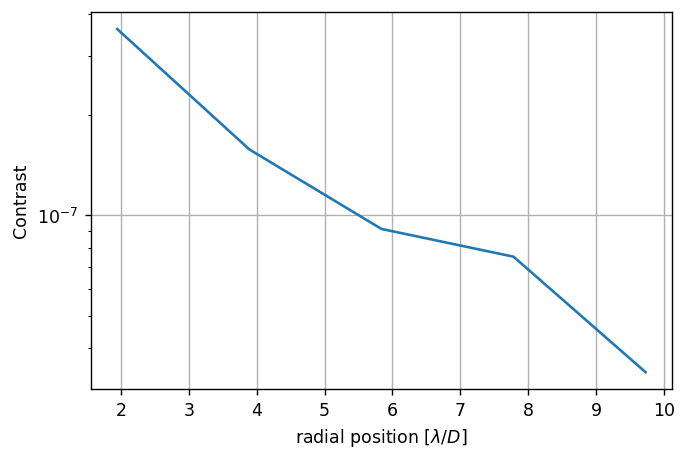

	Running iteration 10/10.


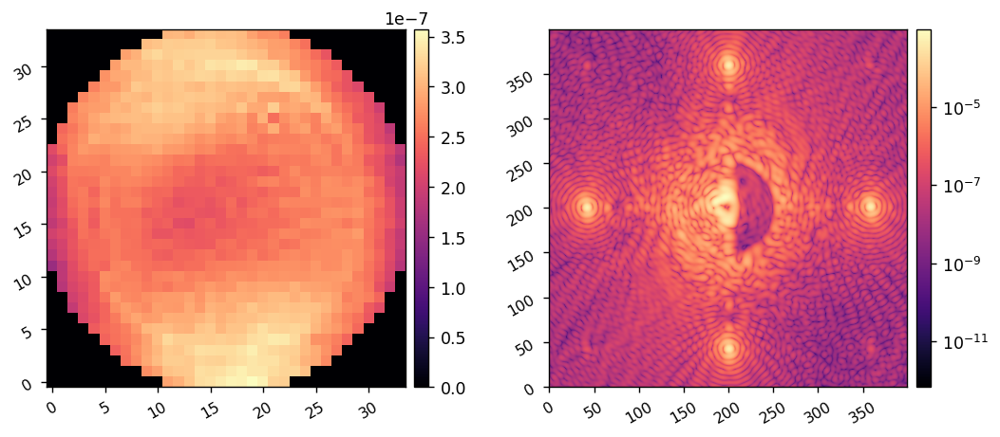

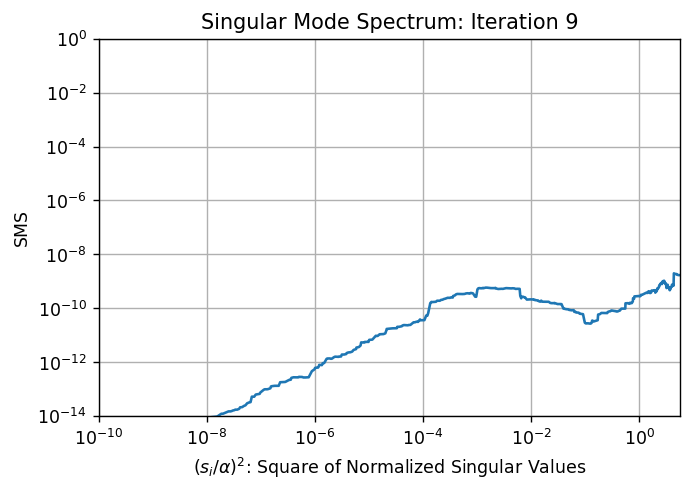

C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


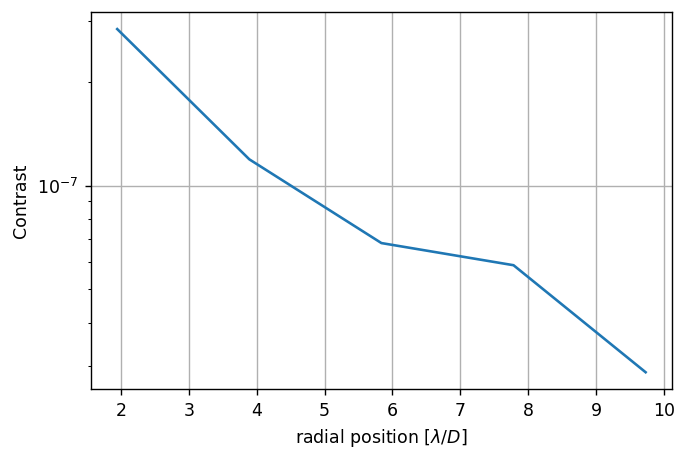

	Running iteration 11/10.


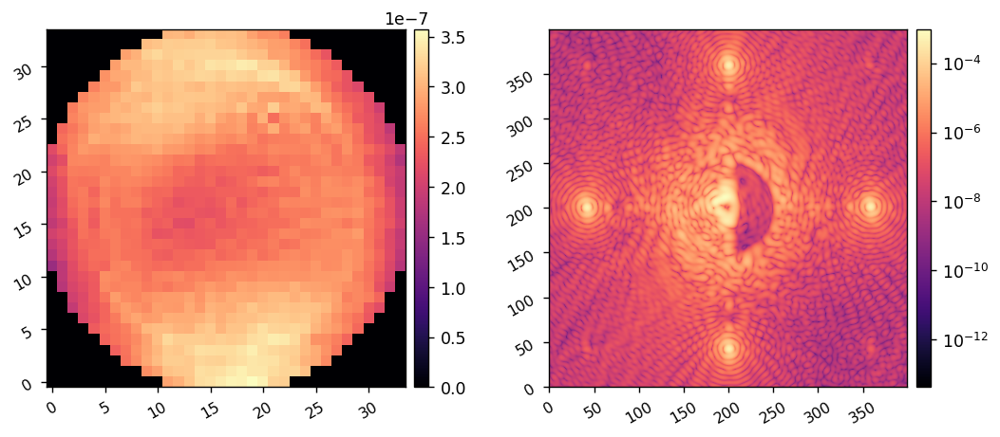

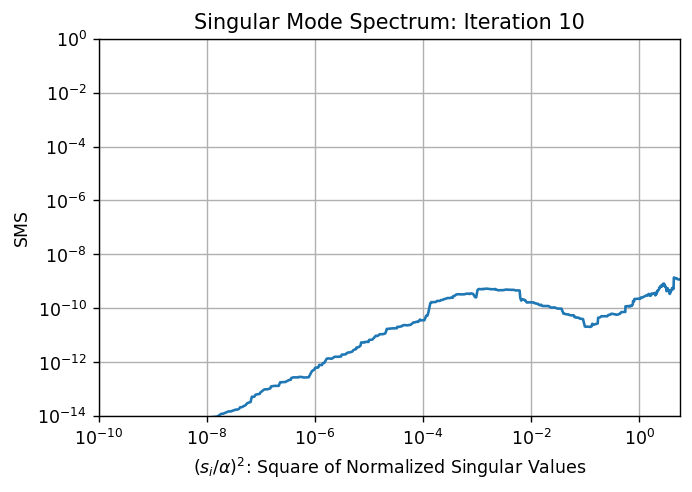

C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


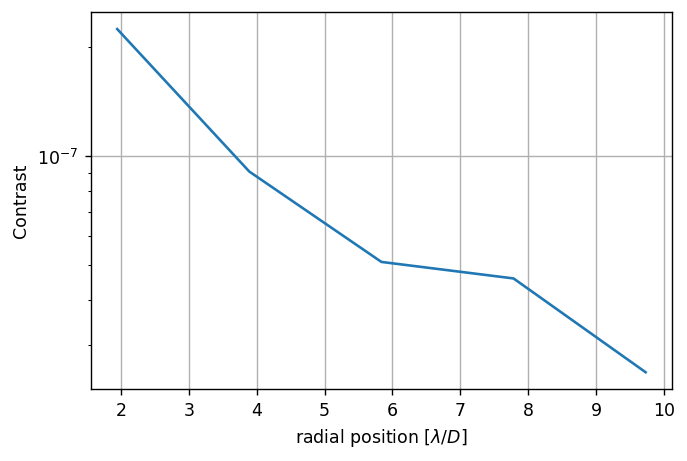

EFC completed in 10.067 sec.
Beginning closed-loop EFC simulation.
Max singular value squared:	 30645517736623.81
alpha^2:			 5377789847567.994

	Running iteration 1/10.


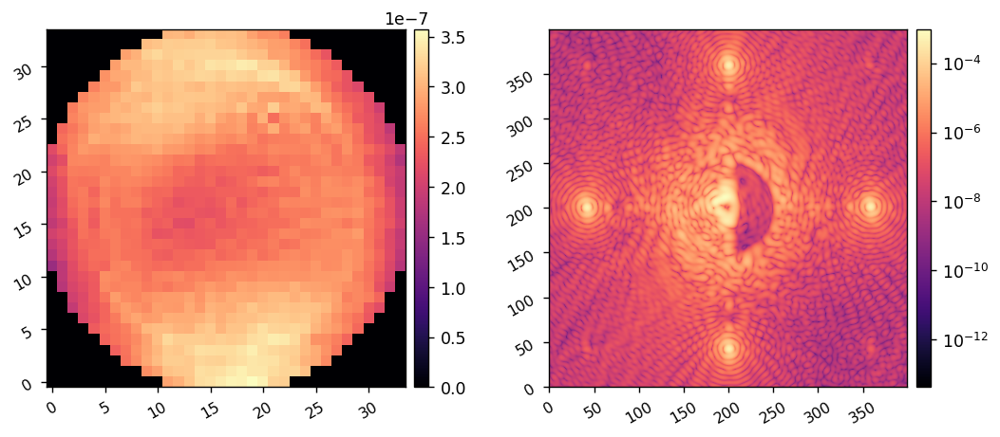

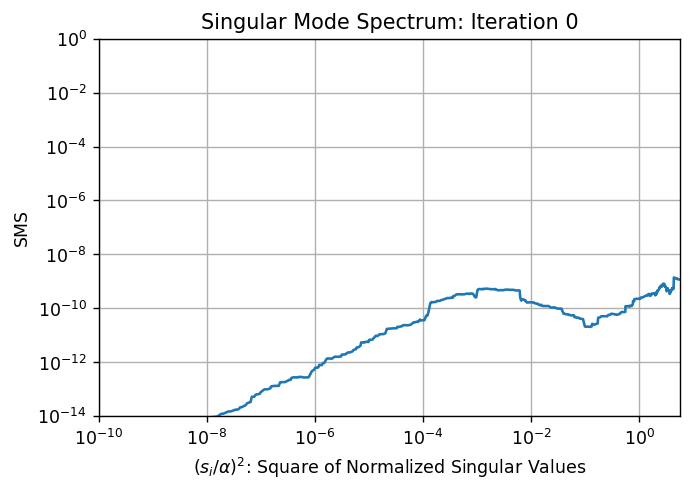

C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


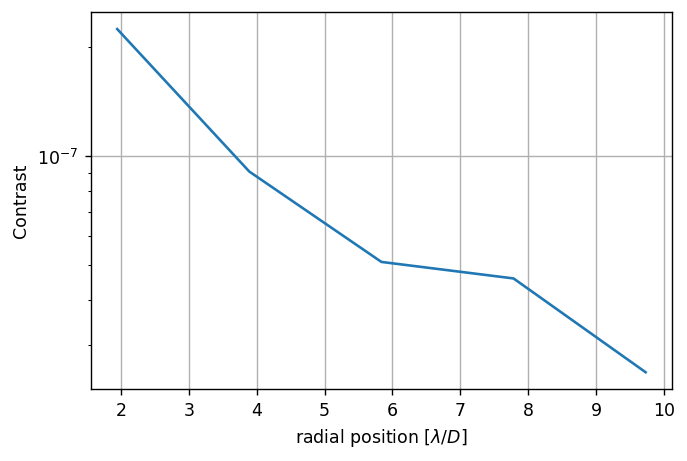

	Running iteration 2/10.


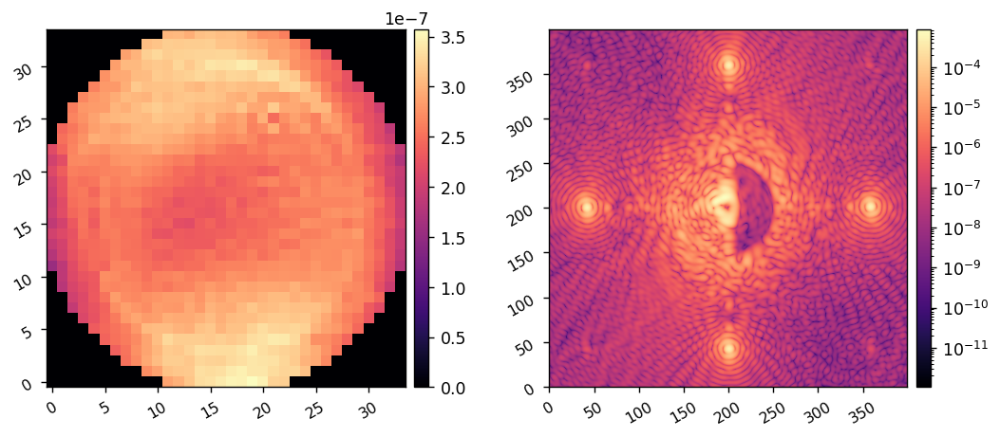

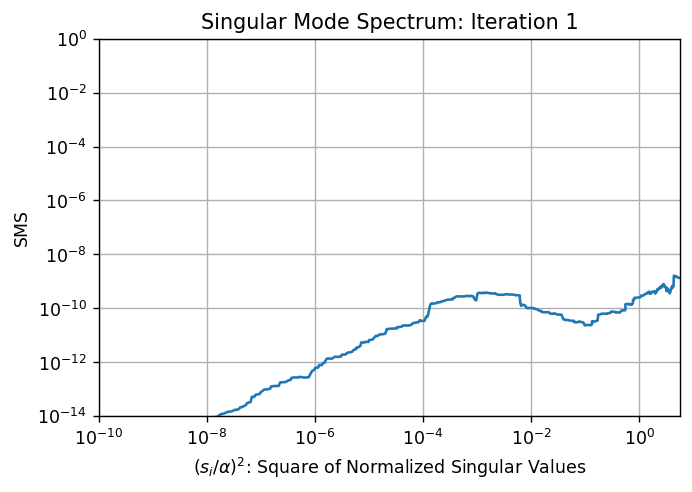

C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


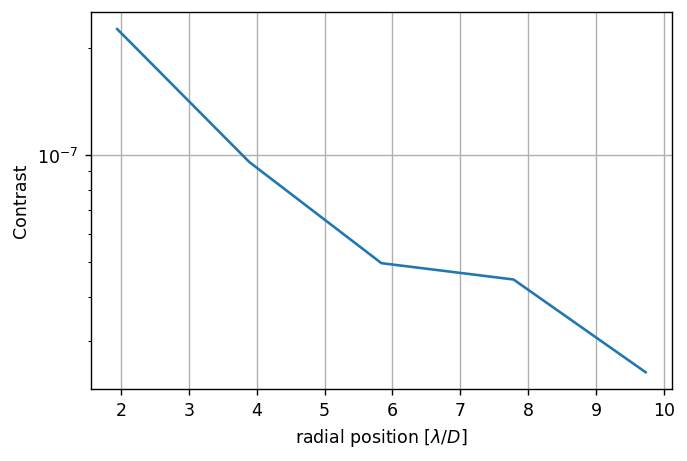

	Running iteration 3/10.


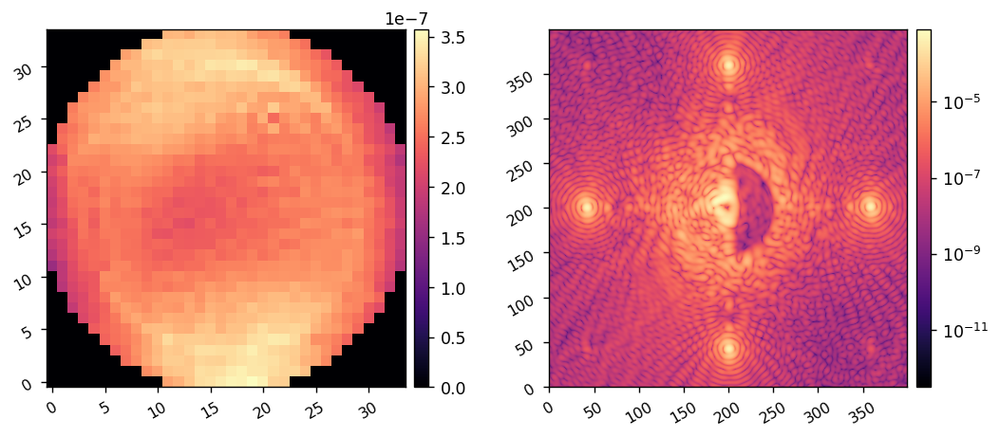

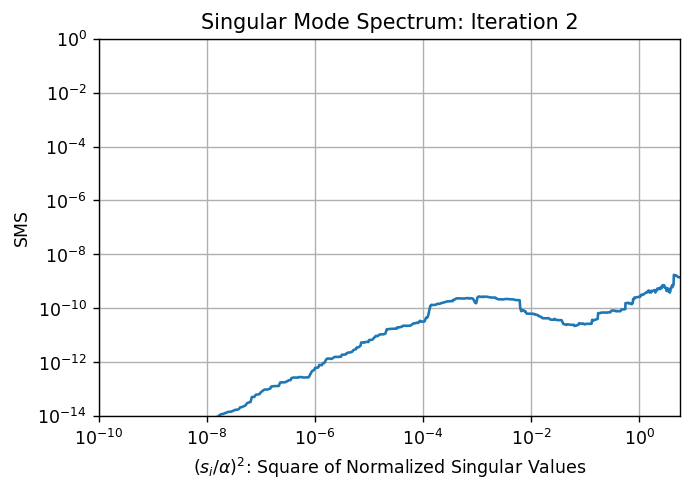

C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


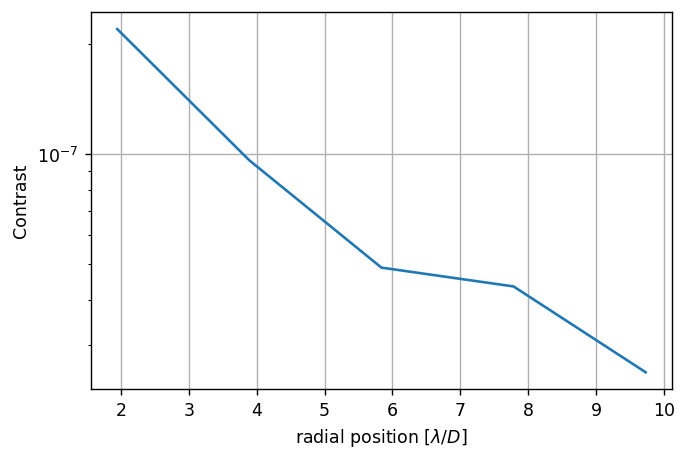

	Running iteration 4/10.


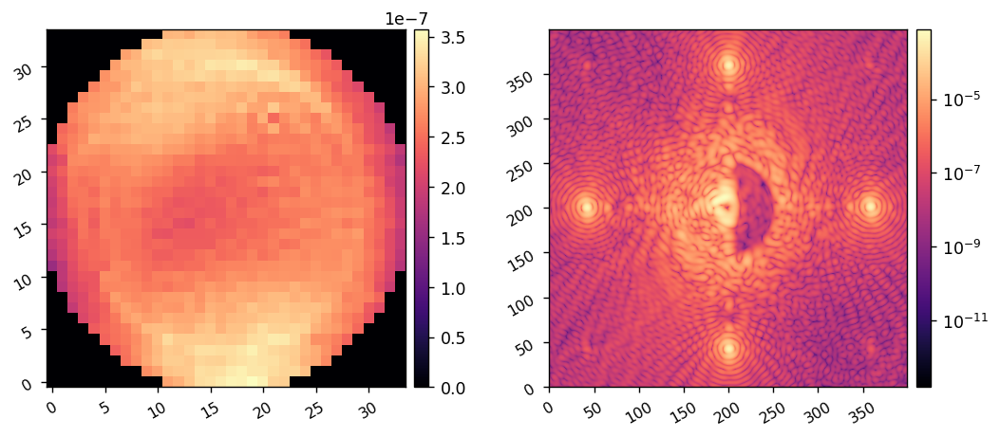

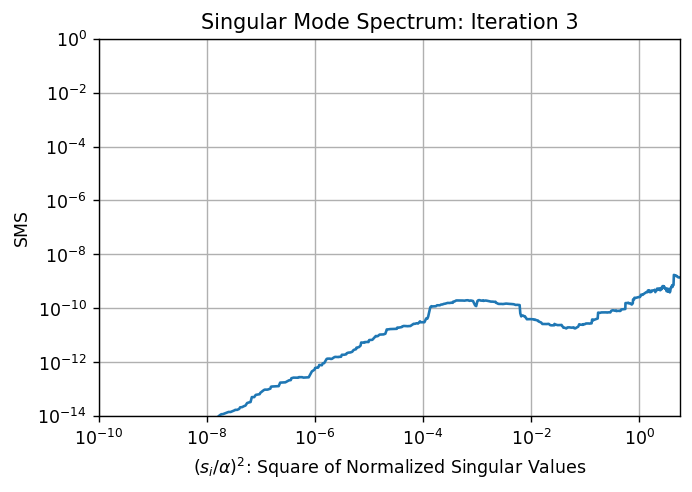

C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


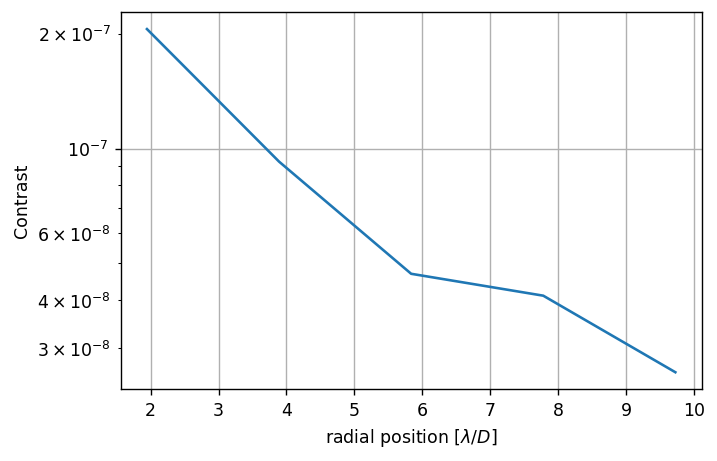

	Running iteration 5/10.


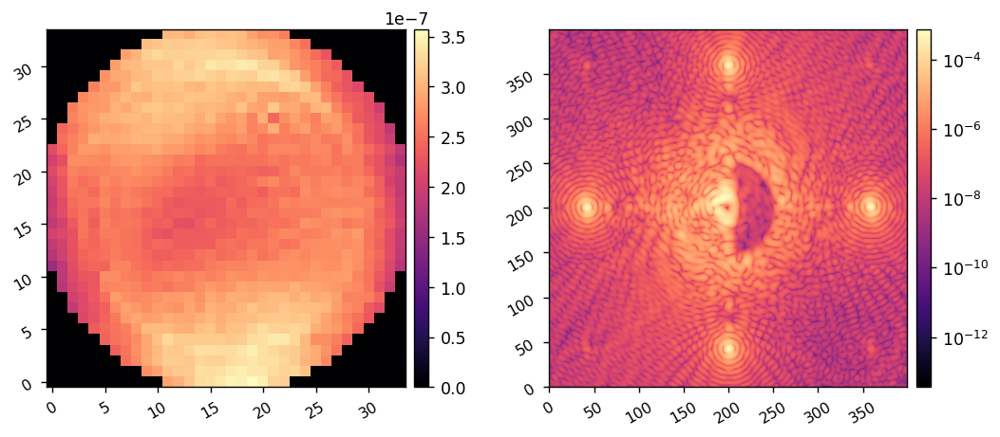

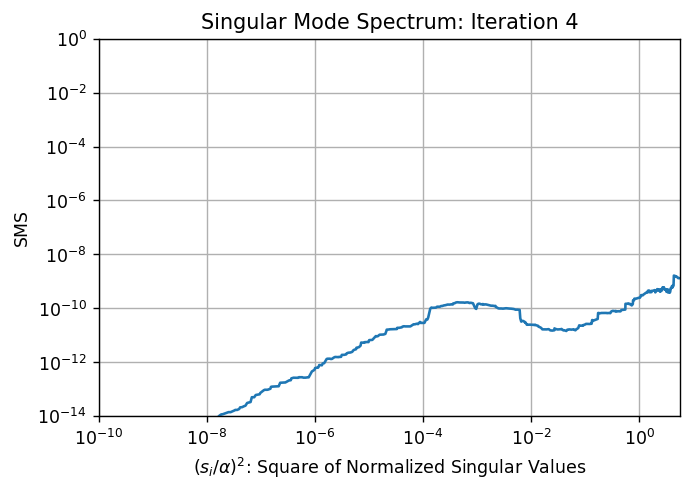

C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


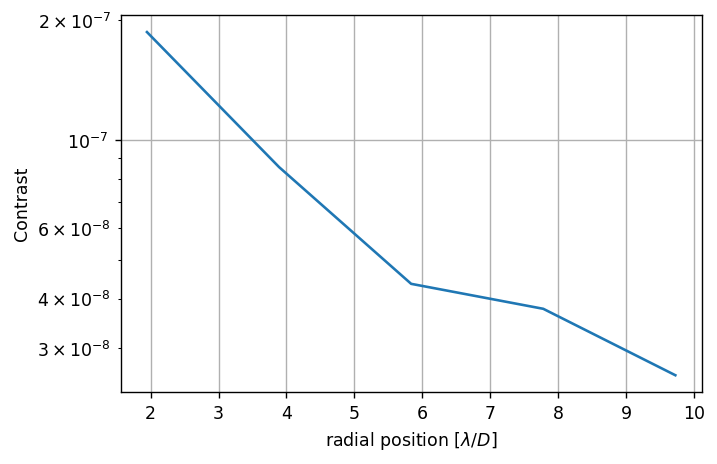

	Running iteration 6/10.


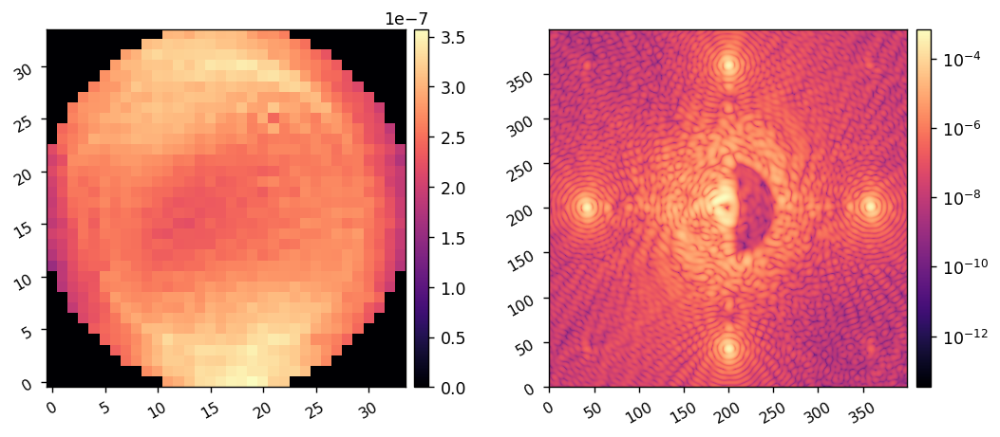

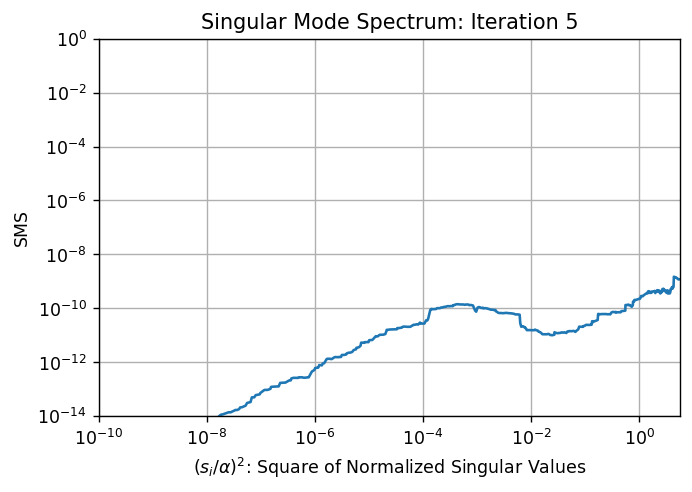

C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


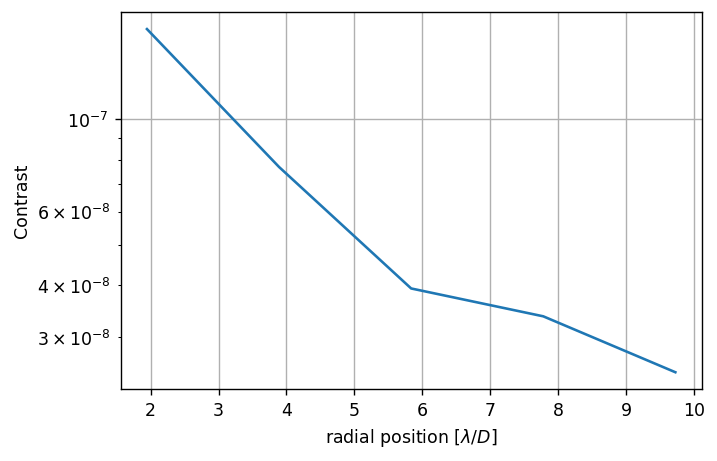

	Running iteration 7/10.


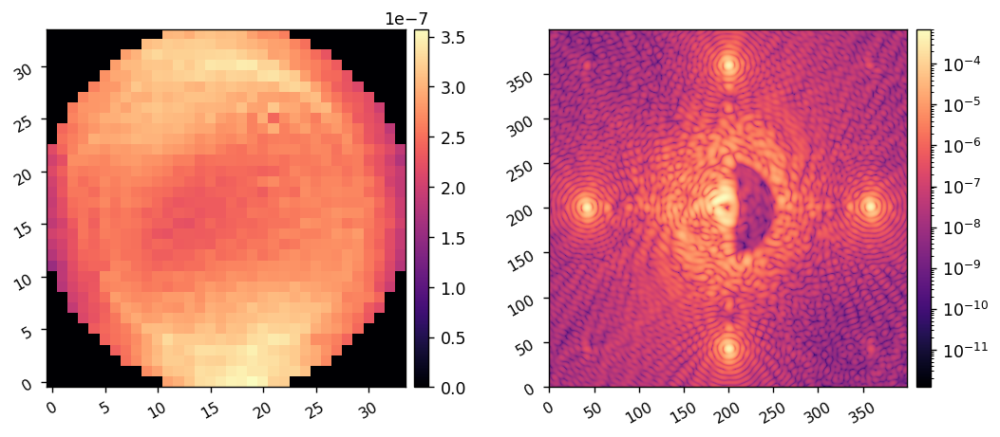

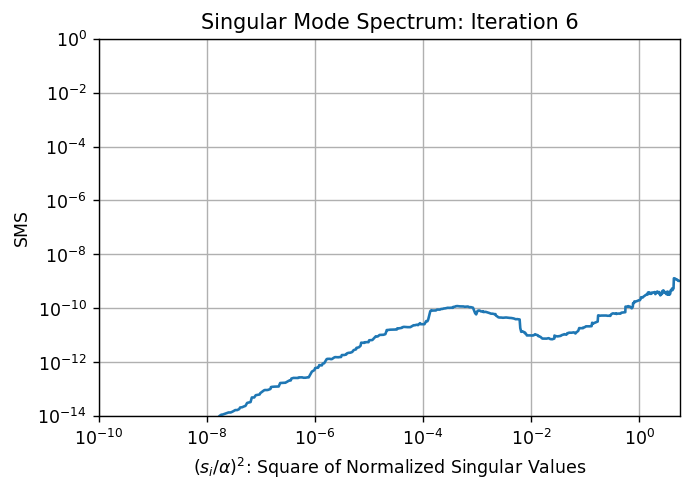

C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


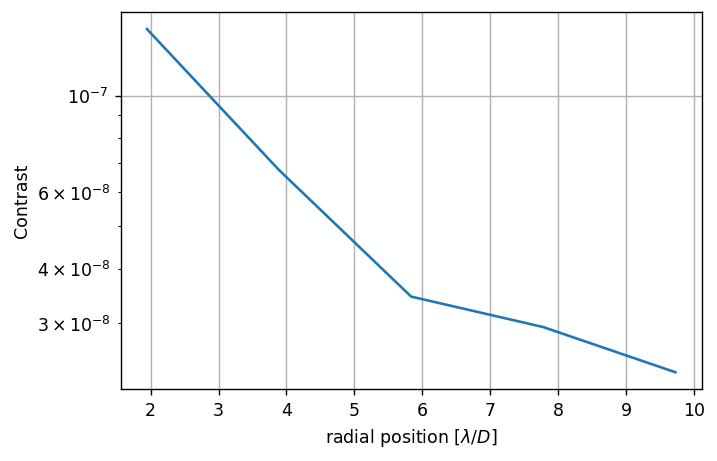

	Running iteration 8/10.


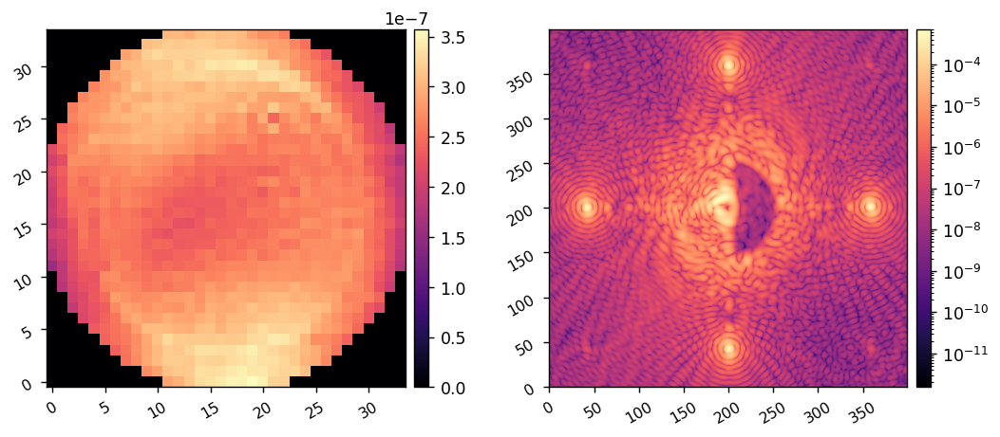

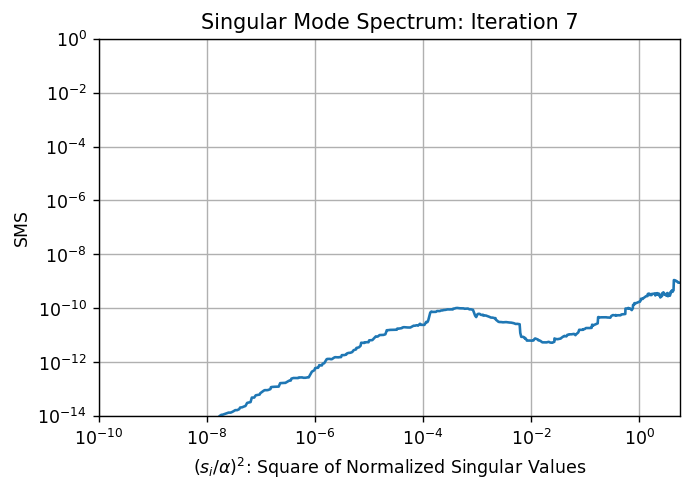

C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


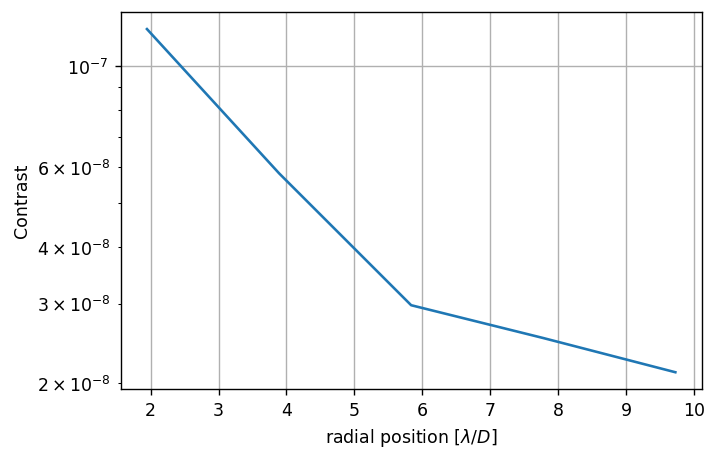

	Running iteration 9/10.


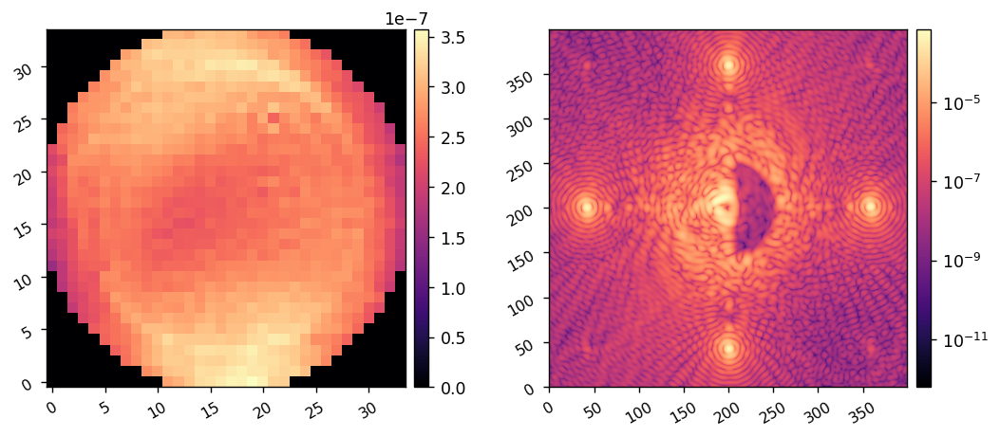

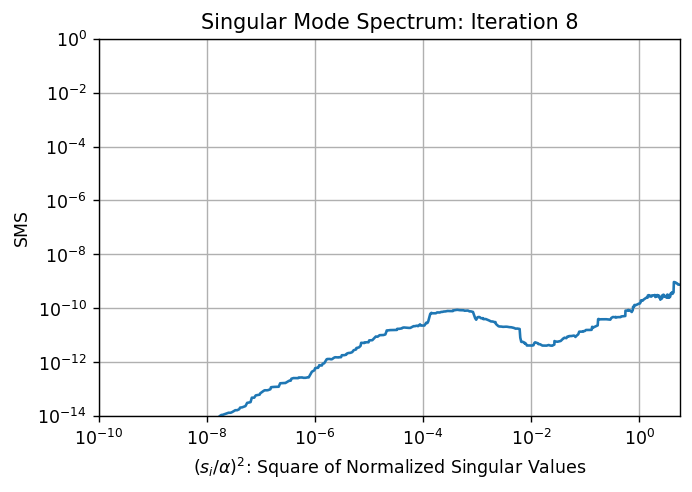

C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


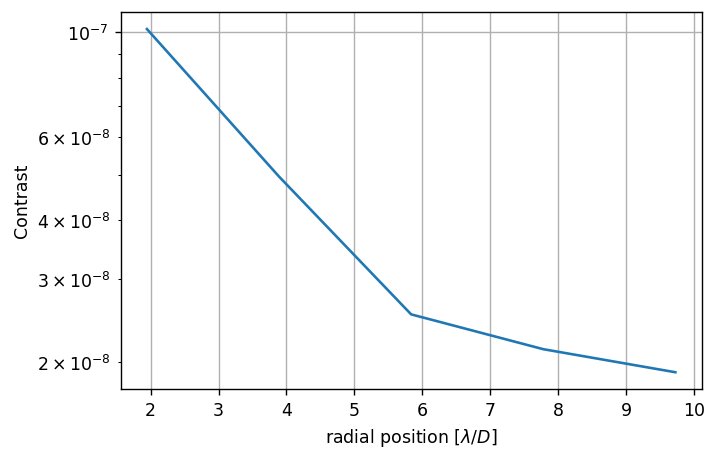

	Running iteration 10/10.


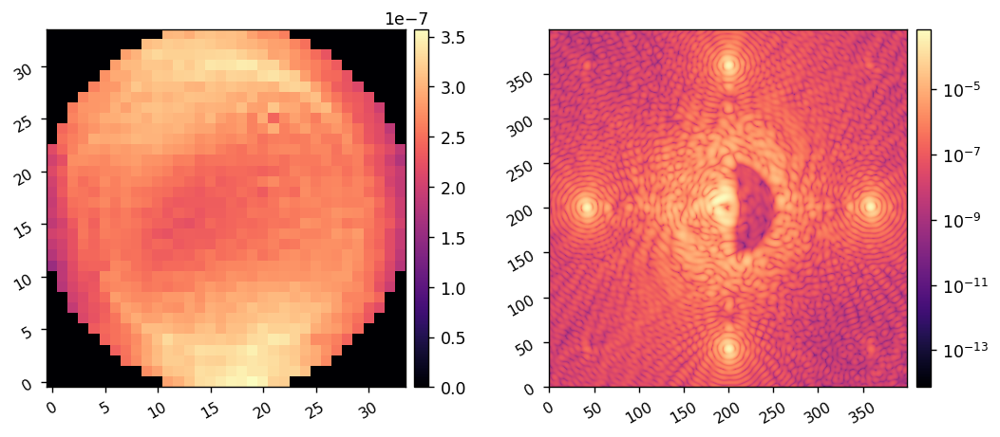

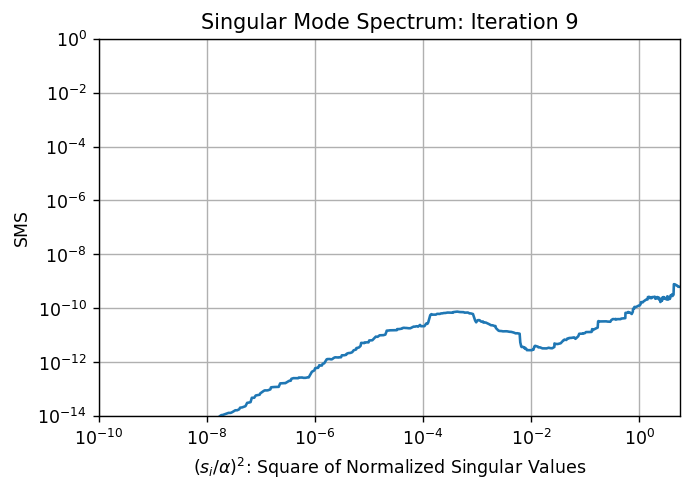

C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


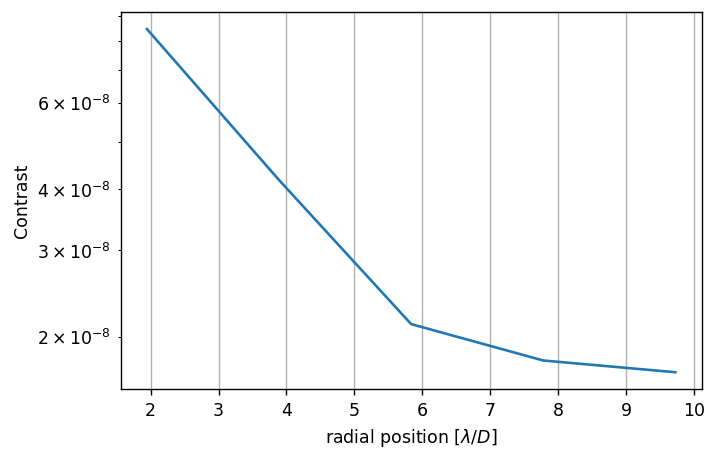

	Running iteration 11/10.


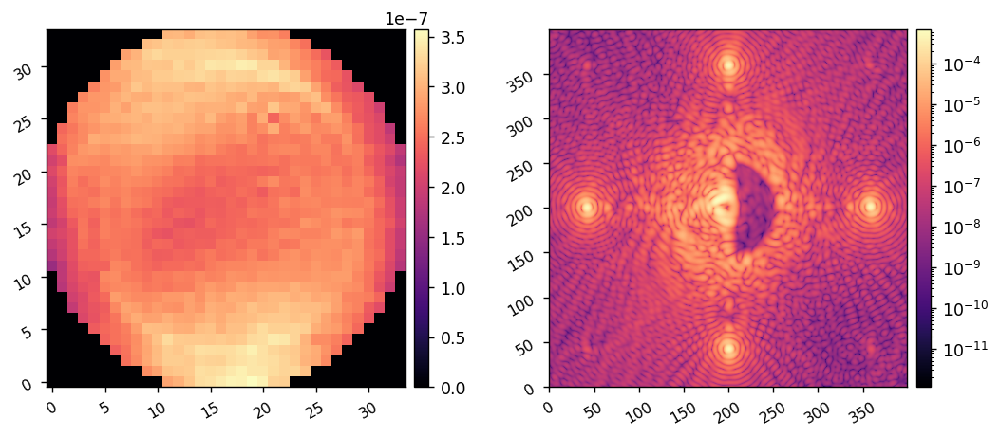

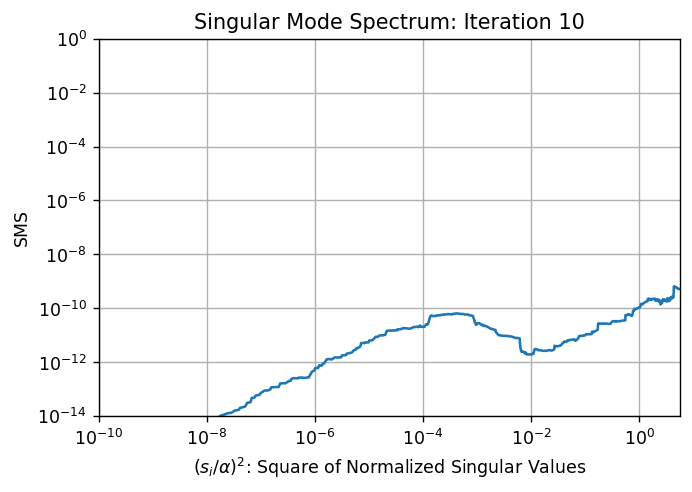

C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Kian\anaconda3\envs\poppy-env\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


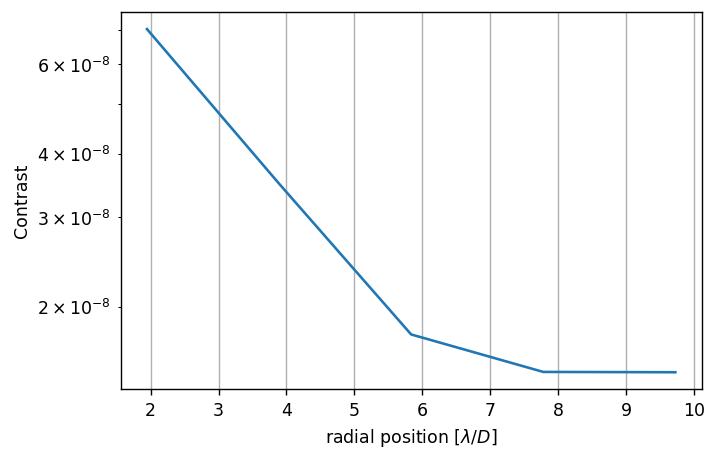

EFC completed in 11.197 sec.


In [14]:
reload(lina.efc)
reload(lina.utils)
model.set_dm(dm_flat)

reg_conds = [(-1, 10), (-2,10), (-3,10)]

for i in range(len(reg_conds)):
    control_matrix = utils.beta_reg(jac, reg_conds[i][0])
    
    ims, commands = lina.efc.run_efc_perfect(model, 
                                            jac, 
                                            control_matrix,
                                            dark_mask, 
                                            Imax_unocc=1,
                                            efc_loop_gain=0.5, 
                                            iterations=reg_conds[i][1], 
                                            plot_all=True, 
                                            plot_sms=True,
                                             plot_radial_contrast=True)